## 1. Setup και Φόρτωση Δεδομένων

### 1.1 Imports και έλεγχος GPU

In [ ]:
# Imports βασικών βιβλιοθηκών
import os
import time
import json
import gc
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

# Scikit-learn για μετρικές
from sklearn.metrics import (
    f1_score, accuracy_score,
    confusion_matrix, classification_report
)
from tqdm.auto import tqdm

sns.set_style("whitegrid")

# Ρύθμιση seeds για αναπαραγωγιμότητα των αποτελεσμάτων
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Έλεγχος διαθεσιμότητας GPU
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("Δεν υπάρχει GPU.")


PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4
VRAM: 15.64 GB


### 1.2 Σύνδεση με Google Drive

In [ ]:
# Σύνδεση του Google Drive για ανάγνωση του dataset και αποθήκευση αποτελεσμάτων
from google.colab import drive
drive.mount('/content/drive')

# Δημιουργία της δομής φακέλων του project
PROJECT_DIR = '/content/drive/MyDrive/Food11_Project'
os.makedirs(PROJECT_DIR, exist_ok=True)
os.makedirs(f'{PROJECT_DIR}/checkpoints', exist_ok=True)
os.makedirs(f'{PROJECT_DIR}/logs', exist_ok=True)
os.makedirs(f'{PROJECT_DIR}/figures', exist_ok=True)

print(f"Project directory: {PROJECT_DIR}")

Mounted at /content/drive
Project directory: /content/drive/MyDrive/Food11_Project


### 1.3 Αποσυμπίεση του Food-11 dataset. Το dataset βρίσκεται ως zip αρχείο στον φάκελο του project στο Google Drive. Αποσυμπιέζεται στον τοπικό δίσκο του Colab για γρηγορότερη πρόσβαση κατά τη διάρκεια του training.

In [ ]:
# Path του zip στο Drive
ZIP_PATH = f'{PROJECT_DIR}/food11-image-dataset.zip'

# Path όπου θα γίνει το unzip
DATA_DIR = '/content/food11_data'
TRAIN_DIR = f'{DATA_DIR}/training'
VAL_DIR = f'{DATA_DIR}/validation'
TEST_DIR = f'{DATA_DIR}/evaluation'

# Έλεγχος αν υπάρχει ήδη unzipped
if os.path.exists(TRAIN_DIR):
    print("Το dataset είναι ήδη αποσυμπιεσμένο.")
else:
    assert os.path.exists(ZIP_PATH), f"Δεν βρέθηκε το zip στο: {ZIP_PATH}"
    size_gb = os.path.getsize(ZIP_PATH) / 1e9
    print(f"Βρέθηκε το zip ({size_gb:.2f} GB), ξεκινάει η αποσυμπίεση.")

    start = time.time()
    os.makedirs(DATA_DIR, exist_ok=True)
    !unzip -q "{ZIP_PATH}" -d {DATA_DIR}
    elapsed = time.time() - start
    print(f"Η αποσυμπίεση ολοκληρώθηκε σε {elapsed:.0f} δευτερόλεπτα.")

# Έλεγχος της δομής των φακέλων
!ls {DATA_DIR}

Βρέθηκε το zip (1.16 GB), ξεκινάει η αποσυμπίεση.
Η αποσυμπίεση ολοκληρώθηκε σε 25 δευτερόλεπτα.
evaluation  training  validation


## 2. Exploratory Data Analysis (EDA). Ανάλυση του dataset για την κατανόηση της κατανομής των κλάσεων, της μορφής των δειγμάτων και των διαστάσεων των εικόνων. Τα ευρήματα θα καθορίσουν τις επιλογές προ-επεξεργασίας και training.

### 2.1 Κλάσεις του dataset

In [ ]:
# Τα ονόματα των κλάσεων προκύπτουν αυτόματα από τα ονόματα των υποφακέλων
# στον φάκελο training και είναι αλφαβητικά για συμβατότητα με το ImageFolder.
CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))

print(f"Αριθμός κλάσεων: {len(CLASS_NAMES)}")
print(f"\nΛίστα κλάσεων:")
for i, name in enumerate(CLASS_NAMES):
    print(f"  {i:2d}: {name}")

Αριθμός κλάσεων: 11

Λίστα κλάσεων:
   0: Bread
   1: Dairy product
   2: Dessert
   3: Egg
   4: Fried food
   5: Meat
   6: Noodles-Pasta
   7: Rice
   8: Seafood
   9: Soup
  10: Vegetable-Fruit


### 2.2 Στατιστικά κατανομής δειγμάτων ανά κλάση

In [ ]:
def count_images(directory):
    """Μετράει τις εικόνες ανά κλάση σε ένα directory."""
    counts = {}
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            counts[class_name] = len([
                f for f in os.listdir(class_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))
            ])
    return counts

# Υπολογισμός counts ανά split
train_counts = count_images(TRAIN_DIR)
val_counts = count_images(VAL_DIR)
test_counts = count_images(TEST_DIR)

# Συγκεντρωτικός πίνακας
df_counts = pd.DataFrame({
    'Train': train_counts,
    'Validation': val_counts,
    'Test': test_counts
})
df_counts['Total'] = df_counts.sum(axis=1)
df_counts.loc['TOTAL'] = df_counts.sum()

print(df_counts)
print(f"\nΣυνολικός αριθμός εικόνων: {df_counts.loc['TOTAL', 'Total']}")

# Υπολογισμός imbalance ratio
class_counts_arr = np.array([train_counts[c] for c in CLASS_NAMES])
imbalance = class_counts_arr.max() / class_counts_arr.min()
print(f"Imbalance ratio (max/min) στο training set: {imbalance:.2f}x")

                 Train  Validation  Test  Total
Bread              994         362   368   1724
Dairy product      429         144   148    721
Dessert           1500         500   500   2500
Egg                986         327   335   1648
Fried food         848         326   287   1461
Meat              1325         449   432   2206
Noodles-Pasta      440         147   147    734
Rice               280          96    96    472
Seafood            855         347   303   1505
Soup              1500         500   500   2500
Vegetable-Fruit    709         232   231   1172
TOTAL             9866        3430  3347  16643

Συνολικός αριθμός εικόνων: 16643
Imbalance ratio (max/min) στο training set: 5.36x


### 2.3 Οπτικοποίηση κατανομής κλάσεων. Η οπτικοποίηση επιβεβαιώνει το imbalance του dataset. Κάποιες κλάσεις (π.χ. Dessert, Soup) έχουν περισσότερα δείγματα από άλλες (π.χ. Rice). Αυτό θα αντιμετωπιστεί με weighted loss function κατά το training.

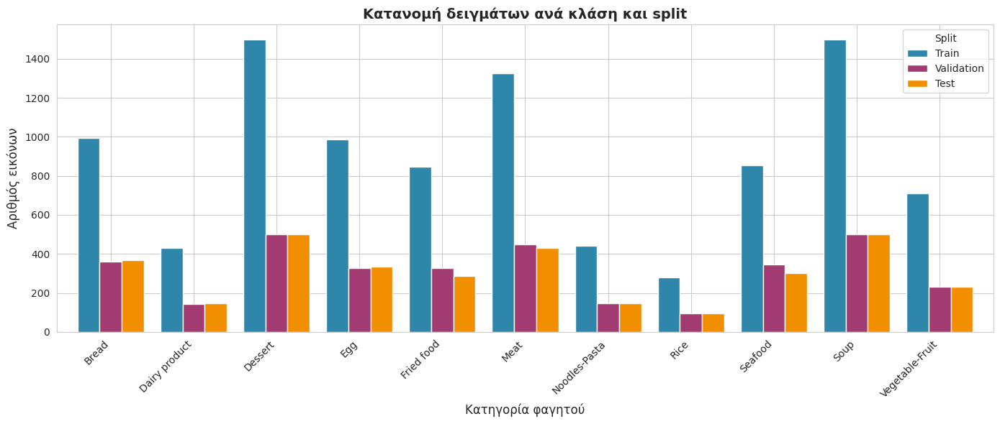

In [ ]:
fig, ax = plt.subplots(figsize=(14, 6))
df_plot = df_counts.drop('TOTAL').drop(columns=['Total'])
df_plot.plot(kind='bar', ax=ax, width=0.8,
             color=['#2E86AB', '#A23B72', '#F18F01'])

ax.set_title('Κατανομή δειγμάτων ανά κλάση και split',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Κατηγορία φαγητού', fontsize=12)
ax.set_ylabel('Αριθμός εικόνων', fontsize=12)
ax.legend(title='Split')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/class_distribution.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 2.4 Δείγματα εικόνων από κάθε κλάση

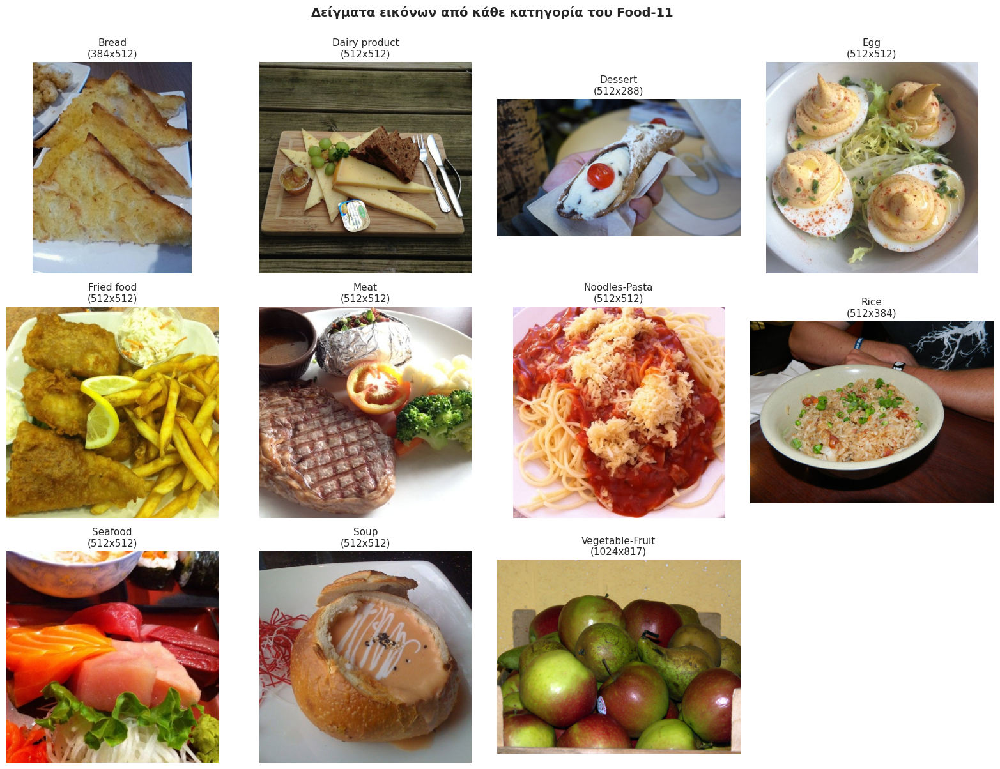

In [ ]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

for idx, class_name in enumerate(CLASS_NAMES):
    class_path = os.path.join(TRAIN_DIR, class_name)
    sample_image = os.listdir(class_path)[0]
    img = Image.open(os.path.join(class_path, sample_image))
    axes[idx].imshow(img)
    axes[idx].set_title(f'{class_name}\n({img.size[0]}x{img.size[1]})',
                         fontsize=11)
    axes[idx].axis('off')

# Κρύψιμο του 12ου axis (έχουμε 11 κλάσεις)
axes[11].axis('off')

plt.suptitle('Δείγματα εικόνων από κάθε κατηγορία του Food-11',
             fontsize=14, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/sample_images.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 2.5 Ανάλυση διαστάσεων εικόνων. Οι εικόνες έχουν διαφορετικές διαστάσεις, οπότε χρειάζεται resize σε σταθερό μέγεθος πριν την είσοδο στο μοντέλο. Επιλέγεται η διάσταση 224x224, που είναι η τυπική για μοντέλα προ-εκπαιδευμένα σε ImageNet.

Ανάλυση διαστάσεων εικόνων (δείγμα 50 εικόνες ανά κλάση).
Width  - min: 270, max: 5616, mean: 541
Height - min: 262, max: 3744, mean: 495


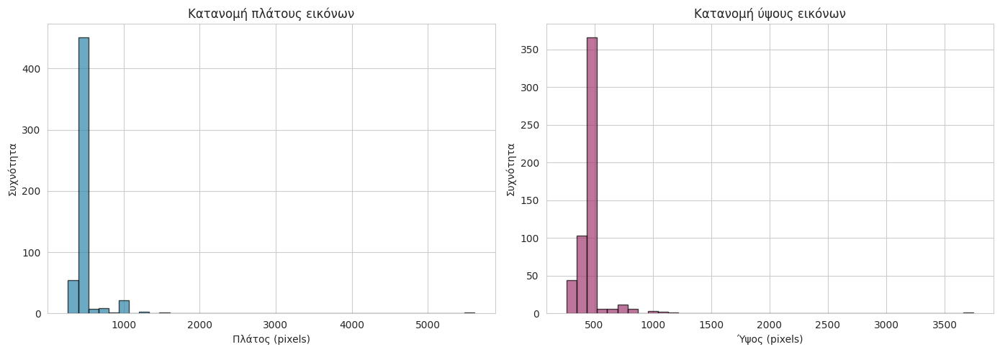

In [ ]:
print("Ανάλυση διαστάσεων εικόνων (δείγμα 50 εικόνες ανά κλάση).")

widths, heights = [], []
for class_name in CLASS_NAMES:
    class_path = os.path.join(TRAIN_DIR, class_name)
    for img_name in os.listdir(class_path)[:50]:
        try:
            with Image.open(os.path.join(class_path, img_name)) as img:
                widths.append(img.size[0])
                heights.append(img.size[1])
        except Exception:
            continue

print(f"Width  - min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}")
print(f"Height - min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}")

# Histograms των διαστάσεων
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(widths, bins=40, color='#2E86AB', alpha=0.7, edgecolor='black')
axes[0].set_title('Κατανομή πλάτους εικόνων')
axes[0].set_xlabel('Πλάτος (pixels)')
axes[0].set_ylabel('Συχνότητα')

axes[1].hist(heights, bins=40, color='#A23B72', alpha=0.7, edgecolor='black')
axes[1].set_title('Κατανομή ύψους εικόνων')
axes[1].set_xlabel('Ύψος (pixels)')
axes[1].set_ylabel('Συχνότητα')

plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/image_dimensions.png',
            dpi=150, bbox_inches='tight')
plt.show()

## 3. PyTorch DataLoaders και Data Augmentation. Στήνονται τα DataLoaders για τα τρία splits του dataset. Στο training set εφαρμόζονται τεχνικές data augmentation για βελτίωση της γενίκευσης. Στο validation και test set εφαρμόζεται μόνο deterministic resize και normalization για να υπάρχει συνέπεια στην αξιολόγηση.

### 3.1 Hyperparameters

In [ ]:
# Βασικές παράμετροι training
IMG_SIZE = 224       # Τυπικό μέγεθος για μοντέλα εκπαιδευμένα σε ImageNet
BATCH_SIZE = 64      # Ασφαλής τιμή για T4 GPU με ResNet50
NUM_WORKERS = 2      # Το Colab διαθέτει 2 CPU cores

print(f"Device: {DEVICE}")
print(f"Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")

Device: cuda
Image size: 224x224
Batch size: 64


### 3.2 Augmentation transforms. Επιλέγονται τεχνικές augmentation που έχουν νόημα για εικόνες φαγητού:- **RandomResizedCrop:** Τυχαίο zoom και crop (προσομοιώνει διαφορετικές γωνίες λήψης)- **RandomHorizontalFlip:** Οριζόντιο mirror (το φαγητό είναι symmetric ως προς τον κατακόρυφο άξονα)- **RandomRotation:** Μικρή περιστροφή έως 15 μοιρών- **ColorJitter:** Μικρές μεταβολές φωτεινότητας/χρώματος για ανθεκτικότητα σε διαφορετικές συνθήκες φωτισμούΔεν χρησιμοποιείται vertical flip, καθώς οι περισσότερες φωτογραφίες φαγητού έχουν σαφή «πάνω/κάτω» προσανατολισμό.

In [ ]:
# Τα standard normalization values του ImageNet, απαραίτητα για pretrained μοντέλα
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Augmentation pipeline για το training set
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2,
                          saturation=0.2, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# Deterministic pipeline για validation και test
eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print("Transforms ορίστηκαν.")
print("\nΤεχνικές augmentation στο training:")
print("  - RandomResizedCrop (scale 0.8-1.0)")
print("  - RandomHorizontalFlip (p=0.5)")
print("  - RandomRotation (+/- 15 μοίρες)")
print("  - ColorJitter (brightness/contrast/saturation/hue)")

Transforms ορίστηκαν.

Τεχνικές augmentation στο training:
  - RandomResizedCrop (scale 0.8-1.0)
  - RandomHorizontalFlip (p=0.5)
  - RandomRotation (+/- 15 μοίρες)
  - ColorJitter (brightness/contrast/saturation/hue)


### 3.3 Δημιουργία Datasets και DataLoaders

In [ ]:
# Το ImageFolder κάνει αυτόματο label assignment βάσει της δομής των φακέλων
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transform)
val_dataset = datasets.ImageFolder(root=VAL_DIR, transform=eval_transform)
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=eval_transform)

# Επιβεβαίωση συμφωνίας των κλάσεων στα τρία splits
assert train_dataset.classes == val_dataset.classes == test_dataset.classes, \
    "Οι κλάσεις δεν συμφωνούν μεταξύ των splits"

print(f"Train dataset:      {len(train_dataset):5d} εικόνες")
print(f"Validation dataset: {len(val_dataset):5d} εικόνες")
print(f"Test dataset:       {len(test_dataset):5d} εικόνες")
print(f"\nClass mapping: {train_dataset.class_to_idx}")

# Δημιουργία των DataLoaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    drop_last=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f"\nDataLoaders έτοιμοι:")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches:   {len(val_loader)}")
print(f"  Test batches:  {len(test_loader)}")

Train dataset:       9866 εικόνες
Validation dataset:  3430 εικόνες
Test dataset:        3347 εικόνες

Class mapping: {'Bread': 0, 'Dairy product': 1, 'Dessert': 2, 'Egg': 3, 'Fried food': 4, 'Meat': 5, 'Noodles-Pasta': 6, 'Rice': 7, 'Seafood': 8, 'Soup': 9, 'Vegetable-Fruit': 10}

DataLoaders έτοιμοι:
  Train batches: 154
  Val batches:   54
  Test batches:  53


### 3.4 Class weights για αντιμετώπιση του imbalance. Λόγω του imbalance του dataset (ratio 5.36x), εφαρμόζεται weighting στο CrossEntropyLoss. Δίνεται μεγαλύτερο βάρος στις μειονοτικές κλάσεις (π.χ. Rice) και μικρότερο στις πλειονοτικές (π.χ. Dessert, Soup), ώστε το μοντέλο να μάθει εξίσου όλες τις κατηγορίες.

In [ ]:
# Υπολογισμός class weights με inverse frequency
class_counts_arr = np.array([train_counts[c] for c in train_dataset.classes])
class_weights = len(train_dataset) / (len(class_counts_arr) * class_counts_arr)
class_weights = torch.FloatTensor(class_weights).to(DEVICE)

print("Class weights για το WeightedCrossEntropyLoss:")
for cls, w in zip(train_dataset.classes, class_weights.cpu().numpy()):
    print(f"  {cls:20s}: {w:.4f}")

print(f"\nΣύνολο train samples: {class_counts_arr.sum()}")
print(f"Imbalance ratio (max/min): {class_counts_arr.max()/class_counts_arr.min():.2f}x")

Class weights για το WeightedCrossEntropyLoss:
  Bread               : 0.9023
  Dairy product       : 2.0907
  Dessert             : 0.5979
  Egg                 : 0.9096
  Fried food          : 1.0577
  Meat                : 0.6769
  Noodles-Pasta       : 2.0384
  Rice                : 3.2032
  Seafood             : 1.0490
  Soup                : 0.5979
  Vegetable-Fruit     : 1.2650

Σύνολο train samples: 9866
Imbalance ratio (max/min): 5.36x


### 3.5 Sanity check - οπτικοποίηση augmented batch

Batch shape: torch.Size([64, 3, 224, 224])
Min value: -2.118, Max value: 2.640


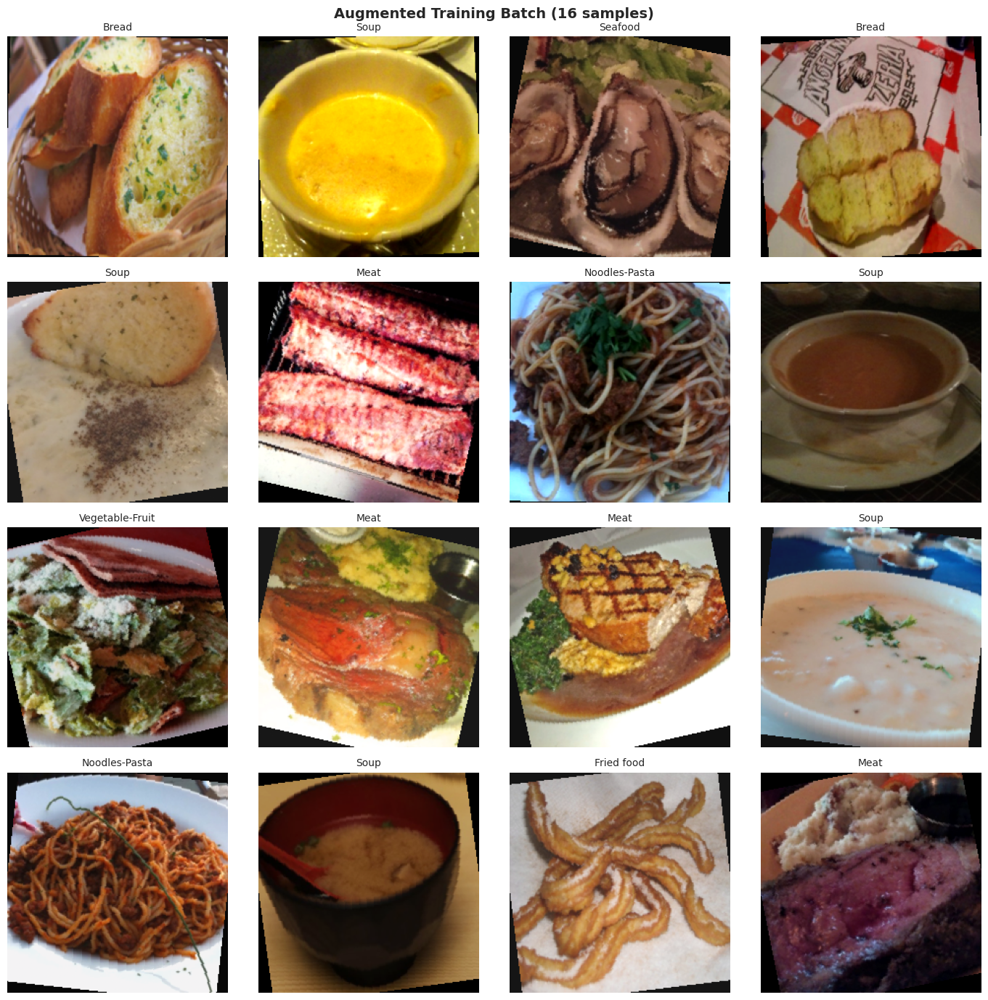

In [ ]:
# Επιβεβαίωση ότι το augmentation pipeline λειτουργεί σωστά
images, labels = next(iter(train_loader))
print(f"Batch shape: {images.shape}")
print(f"Min value: {images.min():.3f}, Max value: {images.max():.3f}")

# De-normalization για οπτικοποίηση
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return tensor * std + mean

# Plot 16 εικόνων
fig, axes = plt.subplots(4, 4, figsize=(14, 14))
for i, ax in enumerate(axes.flatten()):
    img = denormalize(images[i]).permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.set_title(train_dataset.classes[labels[i]], fontsize=10)
    ax.axis('off')

plt.suptitle('Augmented Training Batch (16 samples)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/augmented_batch.png',
            dpi=150, bbox_inches='tight')
plt.show()

## 4. Trainer Class και Helper Functions. Δημιουργούνται reusable κλάσεις και functions που χρησιμοποιούνται από όλα τα μοντέλα της εργασίας, ώστε να εξασφαλιστεί συνέπεια στη μεθοδολογία training και αξιολόγησης.

### 4.1 Custom CNN architecture (baseline). Σχεδιάστηκε ένα CNN από το μηδέν με τέσσερα convolutional blocks και Global Average Pooling. Χρησιμοποιεί BatchNorm για σταθερότητα του training και Dropout για regularization. Το μοντέλο έχει περίπου 1.2M παραμέτρους — αρκετά για να μάθει features, αλλά μικρό ώστε να εκπαιδεύεται γρήγορα.

In [ ]:
class CustomCNN(nn.Module):
    """
    Custom CNN baseline για το Food-11 classification task.

    Αρχιτεκτονική: 4 conv blocks + GAP + 2 FC layers.
    Σχεδιαστικές επιλογές:
      - BatchNorm μετά από κάθε Conv για σταθερότητα
      - 2 conv layers ανά block (εμπνευσμένο από VGG)
      - Global Average Pooling αντί για flatten (μειώνει params)
      - Dropout 0.5 στο classifier για regularization
    """
    def __init__(self, num_classes=11, dropout=0.5):
        super().__init__()

        # Block 1: 224 -> 112
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        # Block 2: 112 -> 56
        self.block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        # Block 3: 56 -> 28
        self.block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        # Block 4: 28 -> 14
        self.block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        # Global Average Pooling: 14x14x256 -> 1x1x256
        self.gap = nn.AdaptiveAvgPool2d(1)

        # Classifier head
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.gap(x)
        x = self.classifier(x)
        return x


# Test architecture
model_test = CustomCNN(num_classes=11).to(DEVICE)
total_params = sum(p.numel() for p in model_test.parameters())
print(f"CustomCNN - Total parameters: {total_params:,}")

dummy_input = torch.randn(2, 3, 224, 224).to(DEVICE)
output = model_test(dummy_input)
print(f"Forward pass: {dummy_input.shape} -> {output.shape}")
del model_test

CustomCNN - Total parameters: 1,208,491
Forward pass: torch.Size([2, 3, 224, 224]) -> torch.Size([2, 11])


### 4.2 Trainer class και plot_history function. Η Trainer class υλοποιεί το πλήρες training/evaluation loop με tracking μετρικών (loss, accuracy, F1) ανά epoch, αυτόματη αποθήκευση best checkpoint βάσει validation accuracy και υποστήριξη learning rate scheduling. Η plot_history function δημιουργεί τα γραφήματα loss/accuracy/F1 ανά epoch.

In [ ]:
class Trainer:
    """Generic trainer για όλα τα μοντέλα ταξινόμησης της εργασίας."""

    def __init__(self, model, train_loader, val_loader,
                 criterion, optimizer, scheduler=None,
                 device='cuda', checkpoint_path=None):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.criterion = criterion
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.device = device
        self.checkpoint_path = checkpoint_path

        # History tracking για τα plots
        self.history = {
            'train_loss': [], 'train_acc': [], 'train_f1': [],
            'val_loss':   [], 'val_acc':   [], 'val_f1':   [],
            'lr': []
        }
        self.best_val_acc = 0.0

    def train_epoch(self):
        """Ένα πλήρες epoch εκπαίδευσης."""
        self.model.train()
        running_loss = 0.0
        all_preds, all_labels = [], []

        pbar = tqdm(self.train_loader, desc='Train', leave=False)
        for images, labels in pbar:
            images, labels = images.to(self.device), labels.to(self.device)

            self.optimizer.zero_grad()
            outputs = self.model(images)
            loss = self.criterion(outputs, labels)
            loss.backward()
            self.optimizer.step()

            running_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            pbar.set_postfix({'loss': f'{loss.item():.3f}'})

        avg_loss = running_loss / len(self.train_loader.dataset)
        acc = accuracy_score(all_labels, all_preds)
        f1 = f1_score(all_labels, all_preds, average='macro')
        return avg_loss, acc, f1

    @torch.no_grad()
    def evaluate(self, loader):
        """Αξιολόγηση σε ένα DataLoader (val ή test)."""
        self.model.eval()
        running_loss = 0.0
        all_preds, all_labels = [], []

        for images, labels in loader:
            images, labels = images.to(self.device), labels.to(self.device)
            outputs = self.model(images)
            loss = self.criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

        avg_loss = running_loss / len(loader.dataset)
        acc = accuracy_score(all_labels, all_preds)
        f1 = f1_score(all_labels, all_preds, average='macro')
        return avg_loss, acc, f1

    def fit(self, epochs):
        """Πλήρης κύκλος εκπαίδευσης για N epochs."""
        print(f"Training for {epochs} epochs on {self.device}\n")
        start_time = time.time()

        for epoch in range(1, epochs + 1):
            epoch_start = time.time()

            train_loss, train_acc, train_f1 = self.train_epoch()
            val_loss, val_acc, val_f1 = self.evaluate(self.val_loader)

            # Update learning rate scheduler
            current_lr = self.optimizer.param_groups[0]['lr']
            if self.scheduler is not None:
                if isinstance(self.scheduler,
                              torch.optim.lr_scheduler.ReduceLROnPlateau):
                    self.scheduler.step(val_loss)
                else:
                    self.scheduler.step()

            # Logging
            self.history['train_loss'].append(train_loss)
            self.history['train_acc'].append(train_acc)
            self.history['train_f1'].append(train_f1)
            self.history['val_loss'].append(val_loss)
            self.history['val_acc'].append(val_acc)
            self.history['val_f1'].append(val_f1)
            self.history['lr'].append(current_lr)

            epoch_time = time.time() - epoch_start
            print(f"Epoch {epoch:3d}/{epochs} | "
                  f"lr={current_lr:.1e} | "
                  f"train: loss={train_loss:.3f} acc={train_acc:.3f} f1={train_f1:.3f} | "
                  f"val: loss={val_loss:.3f} acc={val_acc:.3f} f1={val_f1:.3f} | "
                  f"{epoch_time:.0f}s")

            # Αποθήκευση best checkpoint
            if val_acc > self.best_val_acc:
                self.best_val_acc = val_acc
                if self.checkpoint_path:
                    torch.save({
                        'epoch': epoch,
                        'model_state_dict': self.model.state_dict(),
                        'val_acc': val_acc,
                        'val_f1': val_f1,
                    }, self.checkpoint_path)
                    print(f"  Best val_acc={val_acc:.4f}, saved.")

        total_time = time.time() - start_time
        print(f"\nTraining ολοκληρώθηκε σε {total_time/60:.1f} λεπτά.")
        print(f"Best validation accuracy: {self.best_val_acc:.4f}")
        return self.history


def plot_history(history, title, save_path=None):
    """Plot των καμπυλών loss/accuracy/F1 ανά epoch."""
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    epochs_range = range(1, len(history['train_loss']) + 1)

    axes[0].plot(epochs_range, history['train_loss'], 'o-',
                 label='Train', color='#2E86AB')
    axes[0].plot(epochs_range, history['val_loss'], 's-',
                 label='Val', color='#A23B72')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title(f'{title} - Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(epochs_range, history['train_acc'], 'o-',
                 label='Train', color='#2E86AB')
    axes[1].plot(epochs_range, history['val_acc'], 's-',
                 label='Val', color='#A23B72')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].set_title(f'{title} - Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    axes[2].plot(epochs_range, history['train_f1'], 'o-',
                 label='Train', color='#2E86AB')
    axes[2].plot(epochs_range, history['val_f1'], 's-',
                 label='Val', color='#A23B72')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Macro F1')
    axes[2].set_title(f'{title} - Macro F1')
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()


print("Trainer class και plot_history function.")

Trainer class και plot_history function.


### 4.3 Two-Phase Transfer Learning helpers. Για τα προ-εκπαιδευμένα μοντέλα εφαρμόζεται η εξής στρατηγική σε δύο φάσεις:**Phase 1 (Frozen backbone):** Παγώνονται όλα τα βάρη του backbone, εκπαιδεύεται μόνο ο νέος classifier head με learning rate 1e-3. Έτσι ο classifier μαθαίνει να αντιστοιχίζει τα ImageNet features στις 11 κατηγορίες φαγητού.**Phase 2 (Full fine-tuning):** Ξεπαγώνονται όλα τα βάρη και γίνεται fine-tuning με πολύ χαμηλά learning rates (1e-5 για το backbone, 1e-4 για τον classifier). Έτσι αποφεύγεται το catastrophic forgetting των ImageNet features.

In [ ]:
def freeze_backbone(model, model_name):
    """Παγώνει το backbone και αφήνει trainable μόνο τον classifier."""
    for param in model.parameters():
        param.requires_grad = False

    # Ξεπάγωμα μόνο του classifier head
    if model_name == 'resnet50':
        for param in model.fc.parameters():
            param.requires_grad = True
    elif model_name in ('mobilenet_v2', 'efficientnet_b0'):
        for param in model.classifier.parameters():
            param.requires_grad = True

    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    print(f"  Trainable: {trainable:,} / {total:,} ({100*trainable/total:.2f}%)")
    return model


def unfreeze_all(model):
    """Ξεπαγώνει όλα τα βάρη για full fine-tuning."""
    for param in model.parameters():
        param.requires_grad = True
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"  Trainable: {trainable:,} (all parameters)")
    return model


def train_two_phase(model, model_name, train_loader, val_loader, class_weights,
                    project_dir, phase1_epochs=5, phase2_epochs=5,
                    phase1_lr=1e-3, phase2_lr_backbone=1e-5,
                    phase2_lr_head=1e-4):
    """
    Two-phase transfer learning training.

    Returns:
        history: dict με loss/accuracy/F1 ανά epoch
        best_val_acc: float, η καλύτερη validation accuracy
        ckpt_path: path του best checkpoint
    """
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    ckpt_path = f'{project_dir}/checkpoints/{model_name}_best.pth'

    # PHASE 1: Frozen backbone, training only the classifier head
    print(f"\n{'='*70}")
    print(f"PHASE 1 - Training classifier head (backbone frozen)")
    print(f"{'='*70}")
    model = freeze_backbone(model, model_name)

    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=phase1_lr,
        weight_decay=1e-4
    )
    trainer = Trainer(
        model, train_loader, val_loader, criterion, optimizer,
        None, DEVICE, ckpt_path
    )
    trainer.fit(epochs=phase1_epochs)

    # PHASE 2: Full fine-tuning with discriminative learning rates
    print(f"\n{'='*70}")
    print(f"PHASE 2 - Full fine-tuning (discriminative learning rates)")
    print(f"{'='*70}")
    model = unfreeze_all(model)

    # Discriminative learning rates: classifier 10x higher than backbone
    if model_name == 'resnet50':
        head_params = list(model.fc.parameters())
    else:
        head_params = list(model.classifier.parameters())
    head_ids = set(id(p) for p in head_params)
    backbone_params = [p for p in model.parameters() if id(p) not in head_ids]

    optimizer = torch.optim.Adam([
        {'params': backbone_params, 'lr': phase2_lr_backbone},
        {'params': head_params,     'lr': phase2_lr_head},
    ], weight_decay=1e-4)

    trainer2 = Trainer(
        model, train_loader, val_loader, criterion, optimizer,
        None, DEVICE, ckpt_path
    )
    # Συνέχεια από το history της Phase 1
    trainer2.history = trainer.history
    trainer2.best_val_acc = trainer.best_val_acc
    trainer2.fit(epochs=phase2_epochs)

    return trainer2.history, trainer2.best_val_acc, ckpt_path


print("2-phase transfer learning helpers.")

2-phase transfer learning helpers.


## 5. Μοντέλα Ταξινόμησης. Συγκρίνονται τέσσερα μοντέλα:||  CustomCNN | ~1.2M | Training from scratch (baseline) || ResNet50 | ~23.5M | 2-phase transfer learning || MobileNetV2 | ~2.2M | 2-phase transfer learning || EfficientNet-B0 | ~4.0M | 2-phase transfer learning ||

### 5.1 Custom CNN (Baseline). Το μοντέλο αυτό εκπαιδεύεται από το μηδέν για να είναι το baseline σύγκρισης. Χρησιμοποιείται Adam optimizer με LR scheduler (ReduceLROnPlateau).

Training for 25 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/25 | lr=1.0e-03 | train: loss=2.290 acc=0.163 f1=0.155 | val: loss=2.277 acc=0.157 f1=0.119 | 153s
  Best val_acc=0.1574, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   2/25 | lr=1.0e-03 | train: loss=2.151 acc=0.202 f1=0.191 | val: loss=2.059 acc=0.265 f1=0.259 | 158s
  Best val_acc=0.2653, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>^^^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
^    ^self._shutdown_workers()^^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    ^if w.is_alive():
^^ ^^

Epoch   3/25 | lr=1.0e-03 | train: loss=2.059 acc=0.242 f1=0.229 | val: loss=2.052 acc=0.269 f1=0.249 | 157s
  Best val_acc=0.2688, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   4/25 | lr=1.0e-03 | train: loss=1.976 acc=0.272 f1=0.259 | val: loss=2.094 acc=0.249 f1=0.247 | 158s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   5/25 | lr=1.0e-03 | train: loss=1.894 acc=0.293 f1=0.279 | val: loss=1.968 acc=0.309 f1=0.274 | 155s
  Best val_acc=0.3087, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   6/25 | lr=1.0e-03 | train: loss=1.807 acc=0.330 f1=0.316 | val: loss=1.992 acc=0.307 f1=0.282 | 163s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   7/25 | lr=1.0e-03 | train: loss=1.769 acc=0.342 f1=0.329 | val: loss=1.905 acc=0.295 f1=0.291 | 158s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   8/25 | lr=1.0e-03 | train: loss=1.743 acc=0.348 f1=0.337 | val: loss=1.672 acc=0.392 f1=0.394 | 157s
  Best val_acc=0.3915, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   9/25 | lr=1.0e-03 | train: loss=1.706 acc=0.360 f1=0.346 | val: loss=1.861 acc=0.331 f1=0.301 | 158s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  10/25 | lr=1.0e-03 | train: loss=1.687 acc=0.375 f1=0.362 | val: loss=1.705 acc=0.386 f1=0.372 | 157s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  11/25 | lr=1.0e-03 | train: loss=1.657 acc=0.387 f1=0.374 | val: loss=1.612 acc=0.428 f1=0.401 | 163s
  Best val_acc=0.4277, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch  12/25 | lr=1.0e-03 | train: loss=1.587 acc=0.399 f1=0.386 | val: loss=1.888 acc=0.318 f1=0.318 | 170s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
   Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>    
^^^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    ^self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    ^if w.is_alive():^^^^^
^  ^^ ^ ^ ^ ^ ^^^^^^^

Epoch  13/25 | lr=1.0e-03 | train: loss=1.573 acc=0.413 f1=0.398 | val: loss=1.658 acc=0.412 f1=0.386 | 171s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch  14/25 | lr=1.0e-03 | train: loss=1.514 acc=0.430 f1=0.425 | val: loss=1.491 acc=0.487 f1=0.495 | 168s
  Best val_acc=0.4866, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch  15/25 | lr=1.0e-03 | train: loss=1.508 acc=0.433 f1=0.425 | val: loss=1.596 acc=0.431 f1=0.423 | 176s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  16/25 | lr=1.0e-03 | train: loss=1.471 acc=0.451 f1=0.444 | val: loss=1.603 acc=0.453 f1=0.404 | 161s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  17/25 | lr=1.0e-03 | train: loss=1.415 acc=0.474 f1=0.471 | val: loss=1.638 acc=0.434 f1=0.402 | 158s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  18/25 | lr=1.0e-03 | train: loss=1.392 acc=0.481 f1=0.480 | val: loss=1.407 acc=0.520 f1=0.524 | 158s
  Best val_acc=0.5198, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  19/25 | lr=1.0e-03 | train: loss=1.373 acc=0.487 f1=0.485 | val: loss=1.290 acc=0.554 f1=0.566 | 159s
  Best val_acc=0.5536, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  20/25 | lr=1.0e-03 | train: loss=1.295 acc=0.511 f1=0.513 | val: loss=1.592 acc=0.456 f1=0.468 | 160s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  21/25 | lr=1.0e-03 | train: loss=1.287 acc=0.513 f1=0.517 | val: loss=2.374 acc=0.278 f1=0.242 | 159s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  22/25 | lr=1.0e-03 | train: loss=1.230 acc=0.537 f1=0.539 | val: loss=1.510 acc=0.505 f1=0.508 | 159s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch  23/25 | lr=1.0e-03 | train: loss=1.192 acc=0.546 f1=0.552 | val: loss=1.842 acc=0.432 f1=0.400 | 160s


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch  24/25 | lr=5.0e-04 | train: loss=1.083 acc=0.581 f1=0.591 | val: loss=1.097 acc=0.618 f1=0.630 | 168s
  Best val_acc=0.6178, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch  25/25 | lr=5.0e-04 | train: loss=1.055 acc=0.586 f1=0.599 | val: loss=1.125 acc=0.603 f1=0.625 | 170s

Training ολοκληρώθηκε σε 67.2 λεπτά.
Best validation accuracy: 0.6178


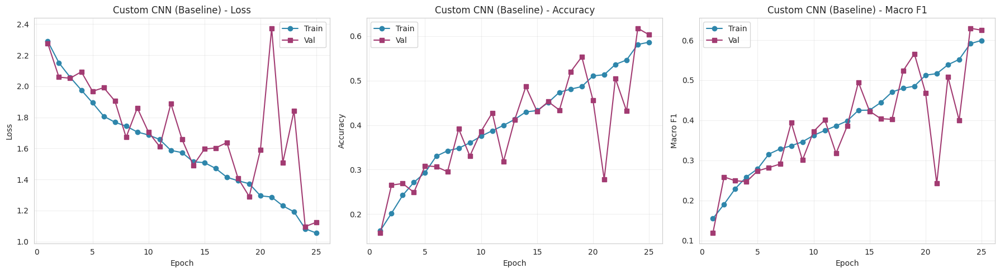

In [ ]:
# Δημιουργία και εκπαίδευση CustomCNN
model_cnn = CustomCNN(num_classes=11).to(DEVICE)

# Loss με class weights για το imbalance
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Adam optimizer με weight decay
optimizer = torch.optim.Adam(
    model_cnn.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

# Scheduler που μειώνει το lr όταν το val_loss σταματάει να βελτιώνεται
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3, min_lr=1e-6
)

trainer_cnn = Trainer(
    model=model_cnn,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    device=DEVICE,
    checkpoint_path=f'{PROJECT_DIR}/checkpoints/custom_cnn_best.pth'
)

# Training - 25 epochs επειδή το μοντέλο εκπαιδεύεται from scratch
NUM_EPOCHS_CNN = 25
history_cnn = trainer_cnn.fit(epochs=NUM_EPOCHS_CNN)

# Αποθήκευση history
with open(f'{PROJECT_DIR}/logs/custom_cnn_history.json', 'w') as f:
    json.dump(history_cnn, f, indent=2)

# Plot training curves
plot_history(history_cnn,
             title='Custom CNN (Baseline)',
             save_path=f'{PROJECT_DIR}/figures/custom_cnn_curves.png')

#### Αξιολόγηση CustomCNN στο test set

In [ ]:
# Φόρτωση του best checkpoint
checkpoint = torch.load(f'{PROJECT_DIR}/checkpoints/custom_cnn_best.pth')
print(f"Best checkpoint από epoch {checkpoint['epoch']}")
print(f"  Validation accuracy: {checkpoint['val_acc']:.4f}")
print(f"  Validation macro F1: {checkpoint['val_f1']:.4f}")

model_cnn.load_state_dict(checkpoint['model_state_dict'])
model_cnn.eval()

# Test set evaluation
test_loss_cnn, test_acc_cnn, test_f1_cnn = trainer_cnn.evaluate(test_loader)
print(f"\nCustom CNN - Test Set Performance:")
print(f"  Loss:     {test_loss_cnn:.4f}")
print(f"  Accuracy: {test_acc_cnn:.4f}")
print(f"  Macro F1: {test_f1_cnn:.4f}")

# Αποθήκευση των final metrics
test_results_cnn = {
    'model': 'CustomCNN',
    'best_epoch': int(checkpoint['epoch']),
    'val_acc': float(checkpoint['val_acc']),
    'val_f1': float(checkpoint['val_f1']),
    'test_loss': float(test_loss_cnn),
    'test_acc': float(test_acc_cnn),
    'test_f1': float(test_f1_cnn),
    'total_params': sum(p.numel() for p in model_cnn.parameters()),
}
with open(f'{PROJECT_DIR}/logs/custom_cnn_results.json', 'w') as f:
    json.dump(test_results_cnn, f, indent=2)

Best checkpoint από epoch 24
  Validation accuracy: 0.6178
  Validation macro F1: 0.6297

Custom CNN - Test Set Performance:
  Loss:     1.0354
  Accuracy: 0.6271
  Macro F1: 0.6370


#### Classification report και Confusion matrix - CustomCNN

Per-class metrics (CustomCNN):

                 precision    recall  f1-score   support

          Bread      0.603     0.375     0.462       368
  Dairy product      0.365     0.628     0.462       148
        Dessert      0.573     0.188     0.283       500
            Egg      0.580     0.388     0.465       335
     Fried food      0.502     0.780     0.611       287
           Meat      0.706     0.741     0.723       432
  Noodles-Pasta      0.796     0.905     0.847       147
           Rice      0.867     0.885     0.876        96
        Seafood      0.524     0.815     0.638       303
           Soup      0.753     0.822     0.786       500
Vegetable-Fruit      0.762     0.970     0.853       231

       accuracy                          0.627      3347
      macro avg      0.639     0.682     0.637      3347
   weighted avg      0.633     0.627     0.602      3347



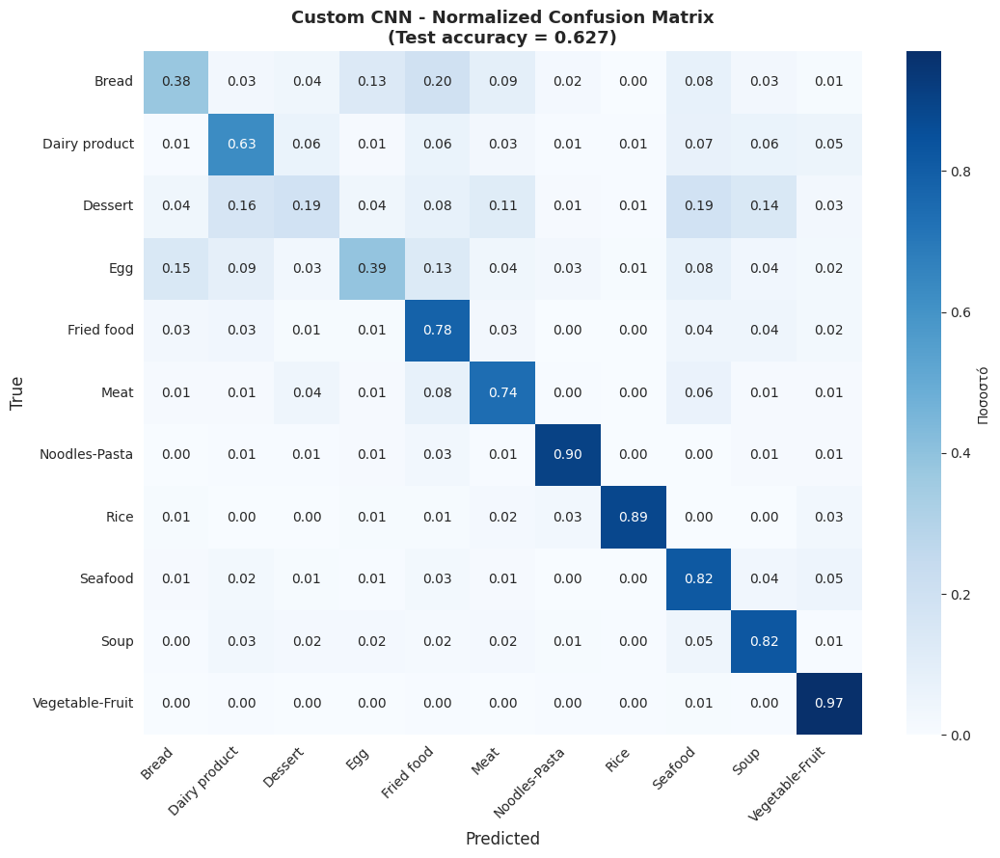

In [ ]:
# Συγκέντρωση όλων των predictions στο test set
all_preds, all_labels = [], []
model_cnn.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        outputs = model_cnn(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Classification report ανά κλάση
print("Per-class metrics (CustomCNN):\n")
print(classification_report(all_labels, all_preds,
                            target_names=CLASS_NAMES, digits=3))

# Normalized confusion matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            cbar_kws={'label': 'Ποσοστό'}, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title(f'Custom CNN - Normalized Confusion Matrix\n'
             f'(Test accuracy = {test_acc_cnn:.3f})',
             fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/custom_cnn_confusion_matrix.png',
            dpi=150, bbox_inches='tight')
plt.show()

# Cleanup μνήμης
del model_cnn, trainer_cnn, optimizer, scheduler
gc.collect()
torch.cuda.empty_cache()

### 5.2 ResNet50 (Transfer Learning). Το ResNet50 είναι μια κλασική deep αρχιτεκτονική με residual connections, εκπαιδευμένη σε 1.2M εικόνες ImageNet. Αντικαθιστούμε το τελικό fully connected layer με ένα νέο για 11 κλάσεις και εφαρμόζουμε 2-phase training (5+5 epochs).

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

# Φόρτωση pretrained ResNet50 (IMAGENET1K_V2: βελτιωμένα training recipes)
weights = ResNet50_Weights.IMAGENET1K_V2
model_resnet = resnet50(weights=weights)

# Αντικατάσταση του fc layer: 2048 -> 11 κλάσεις, με dropout για regularization
num_features = model_resnet.fc.in_features
model_resnet.fc = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 11)
)
model_resnet = model_resnet.to(DEVICE)

total = sum(p.numel() for p in model_resnet.parameters())
print(f"ResNet50 - Total parameters: {total:,}")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 106MB/s]


ResNet50 - Total parameters: 23,530,571


In [ ]:
# 2-phase training (5 epochs frozen + 5 epochs fine-tune)
history_resnet, best_val_acc_resnet, ckpt_resnet = train_two_phase(
    model=model_resnet,
    model_name='resnet50',
    train_loader=train_loader,
    val_loader=val_loader,
    class_weights=class_weights,
    project_dir=PROJECT_DIR,
    phase1_epochs=5,
    phase2_epochs=5,
)

# Αποθήκευση history
with open(f'{PROJECT_DIR}/logs/resnet50_history.json', 'w') as f:
    json.dump(history_resnet, f, indent=2)

print(f"\nResNet50 best validation accuracy: {best_val_acc_resnet:.4f}")


PHASE 1 - Training classifier head (backbone frozen)
  Trainable: 22,539 / 23,530,571 (0.10%)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/5 | lr=1.0e-03 | train: loss=1.479 acc=0.609 f1=0.610 | val: loss=1.004 acc=0.744 f1=0.743 | 151s
  Best val_acc=0.7443, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   2/5 | lr=1.0e-03 | train: loss=0.892 acc=0.739 f1=0.743 | val: loss=0.794 acc=0.778 f1=0.780 | 152s
  Best val_acc=0.7781, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   3/5 | lr=1.0e-03 | train: loss=0.746 acc=0.763 f1=0.765 | val: loss=0.676 acc=0.807 f1=0.810 | 153s
  Best val_acc=0.8073, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   4/5 | lr=1.0e-03 | train: loss=0.668 acc=0.782 f1=0.786 | val: loss=0.636 acc=0.810 f1=0.810 | 154s
  Best val_acc=0.8102, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   5/5 | lr=1.0e-03 | train: loss=0.626 acc=0.792 f1=0.797 | val: loss=0.604 acc=0.818 f1=0.817 | 154s
  Best val_acc=0.8181, saved.

Training ολοκληρώθηκε σε 13.0 λεπτά.
Best validation accuracy: 0.8181

PHASE 2 - Full fine-tuning (discriminative learning rates)
  Trainable: 23,530,571 (all parameters)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   1/5 | lr=1.0e-05 | train: loss=0.510 acc=0.818 f1=0.822 | val: loss=0.489 acc=0.846 f1=0.847 | 186s
  Best val_acc=0.8464, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   2/5 | lr=1.0e-05 | train: loss=0.425 acc=0.843 f1=0.851 | val: loss=0.451 acc=0.859 f1=0.860 | 183s
  Best val_acc=0.8595, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   3/5 | lr=1.0e-05 | train: loss=0.379 acc=0.857 f1=0.866 | val: loss=0.409 acc=0.873 f1=0.874 | 177s
  Best val_acc=0.8729, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   4/5 | lr=1.0e-05 | train: loss=0.342 acc=0.868 f1=0.876 | val: loss=0.381 acc=0.881 f1=0.883 | 179s
  Best val_acc=0.8810, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   5/5 | lr=1.0e-05 | train: loss=0.297 acc=0.888 f1=0.898 | val: loss=0.363 acc=0.885 f1=0.888 | 181s
  Best val_acc=0.8854, saved.

Training ολοκληρώθηκε σε 15.3 λεπτά.
Best validation accuracy: 0.8854

ResNet50 best validation accuracy: 0.8854


#### Αξιολόγηση ResNet50 στο test set

ResNet50 - Test Set Performance:
  Loss:     0.2881
  Accuracy: 0.9029
  Macro F1: 0.9067


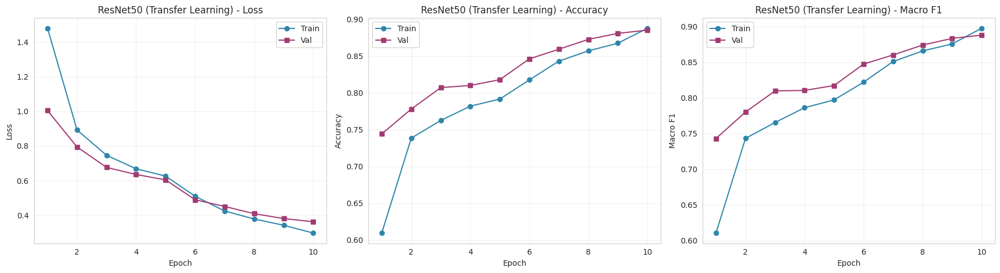

In [ ]:
# Φόρτωση best checkpoint
checkpoint = torch.load(ckpt_resnet)
model_resnet.load_state_dict(checkpoint['model_state_dict'])
model_resnet.eval()

# Test evaluation
criterion = nn.CrossEntropyLoss(weight=class_weights)
tmp_trainer = Trainer(model_resnet, train_loader, val_loader,
                     criterion, None, None, DEVICE)
test_loss_resnet, test_acc_resnet, test_f1_resnet = tmp_trainer.evaluate(test_loader)

print(f"ResNet50 - Test Set Performance:")
print(f"  Loss:     {test_loss_resnet:.4f}")
print(f"  Accuracy: {test_acc_resnet:.4f}")
print(f"  Macro F1: {test_f1_resnet:.4f}")

# Αποθήκευση results
test_results_resnet = {
    'model': 'ResNet50',
    'best_epoch': int(checkpoint['epoch']),
    'val_acc': float(checkpoint['val_acc']),
    'val_f1': float(checkpoint['val_f1']),
    'test_loss': float(test_loss_resnet),
    'test_acc': float(test_acc_resnet),
    'test_f1': float(test_f1_resnet),
    'total_params': sum(p.numel() for p in model_resnet.parameters()),
}
with open(f'{PROJECT_DIR}/logs/resnet50_results.json', 'w') as f:
    json.dump(test_results_resnet, f, indent=2)

# Plot training curves
plot_history(history_resnet,
             title='ResNet50 (Transfer Learning)',
             save_path=f'{PROJECT_DIR}/figures/resnet50_curves.png')

#### Classification report και Confusion matrix - ResNet50

Per-class metrics (ResNet50):

                 precision    recall  f1-score   support

          Bread      0.877     0.875     0.876       368
  Dairy product      0.768     0.919     0.837       148
        Dessert      0.908     0.792     0.846       500
            Egg      0.862     0.860     0.861       335
     Fried food      0.864     0.906     0.884       287
           Meat      0.922     0.903     0.912       432
  Noodles-Pasta      0.918     0.986     0.951       147
           Rice      0.914     1.000     0.955        96
        Seafood      0.898     0.931     0.914       303
           Soup      0.964     0.962     0.963       500
Vegetable-Fruit      0.970     0.978     0.974       231

       accuracy                          0.903      3347
      macro avg      0.897     0.919     0.907      3347
   weighted avg      0.904     0.903     0.903      3347



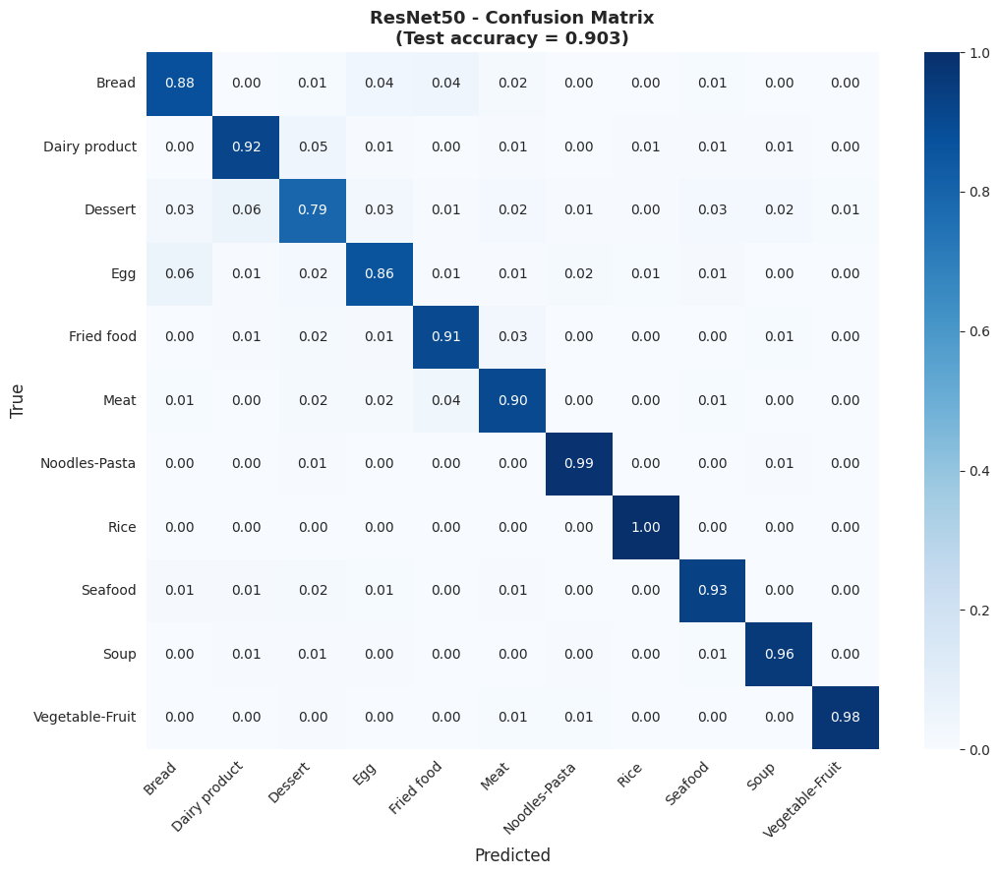

In [ ]:
all_preds, all_labels = [], []
model_resnet.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        outputs = model_resnet(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print("Per-class metrics (ResNet50):\n")
print(classification_report(all_labels, all_preds,
                            target_names=CLASS_NAMES, digits=3))

cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title(f'ResNet50 - Confusion Matrix\n'
             f'(Test accuracy = {test_acc_resnet:.3f})',
             fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/resnet50_confusion_matrix.png',
            dpi=150, bbox_inches='tight')
plt.show()

# Cleanup
del model_resnet, tmp_trainer
gc.collect()
torch.cuda.empty_cache()

### 5.3 MobileNetV2 (Transfer Learning). Το MobileNetV2 σχεδιάστηκε από τη Google για mobile devices με χρήση depthwise separable convolutions. Είναι περίπου 10 φορές μικρότερο από το ResNet50, αλλά πετυχαίνει πολύ καλή ακρίβεια. Είναι κατάλληλο για deployment σε κινητές συσκευές.

In [ ]:
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights

weights = MobileNet_V2_Weights.IMAGENET1K_V2
model_mobilenet = mobilenet_v2(weights=weights)

# Αντικατάσταση του classifier: 1280 -> 11 κλάσεις
num_features = model_mobilenet.classifier[1].in_features
model_mobilenet.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 11)
)
model_mobilenet = model_mobilenet.to(DEVICE)

total = sum(p.numel() for p in model_mobilenet.parameters())
print(f"MobileNetV2 - Total parameters: {total:,}")

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 146MB/s]

MobileNetV2 - Total parameters: 2,237,963


In [ ]:
# 2-phase training
history_mobilenet, best_val_acc_mobilenet, ckpt_mobilenet = train_two_phase(
    model=model_mobilenet,
    model_name='mobilenet_v2',
    train_loader=train_loader,
    val_loader=val_loader,
    class_weights=class_weights,
    project_dir=PROJECT_DIR,
    phase1_epochs=5,
    phase2_epochs=5,
)

with open(f'{PROJECT_DIR}/logs/mobilenet_v2_history.json', 'w') as f:
    json.dump(history_mobilenet, f, indent=2)

print(f"\nMobileNetV2 best validation accuracy: {best_val_acc_mobilenet:.4f}")


PHASE 1 - Training classifier head (backbone frozen)
  Trainable: 14,091 / 2,237,963 (0.63%)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/5 | lr=1.0e-03 | train: loss=1.533 acc=0.565 f1=0.560 | val: loss=1.158 acc=0.666 f1=0.650 | 141s
  Best val_acc=0.6656, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   2/5 | lr=1.0e-03 | train: loss=1.006 acc=0.682 f1=0.683 | val: loss=0.929 acc=0.727 f1=0.719 | 140s
  Best val_acc=0.7265, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   3/5 | lr=1.0e-03 | train: loss=0.872 acc=0.709 f1=0.712 | val: loss=0.846 acc=0.743 f1=0.733 | 141s
  Best val_acc=0.7431, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   4/5 | lr=1.0e-03 | train: loss=0.801 acc=0.723 f1=0.726 | val: loss=0.789 acc=0.756 f1=0.749 | 140s
  Best val_acc=0.7557, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   5/5 | lr=1.0e-03 | train: loss=0.773 acc=0.722 f1=0.728 | val: loss=0.756 acc=0.761 f1=0.751 | 142s
  Best val_acc=0.7606, saved.

Training ολοκληρώθηκε σε 11.9 λεπτά.
Best validation accuracy: 0.7606

PHASE 2 - Full fine-tuning (discriminative learning rates)
  Trainable: 2,237,963 (all parameters)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/5 | lr=1.0e-05 | train: loss=0.702 acc=0.752 f1=0.758 | val: loss=0.682 acc=0.783 f1=0.778 | 150s
  Best val_acc=0.7825, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   2/5 | lr=1.0e-05 | train: loss=0.640 acc=0.767 f1=0.773 | val: loss=0.632 acc=0.791 f1=0.787 | 147s
  Best val_acc=0.7910, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   3/5 | lr=1.0e-05 | train: loss=0.587 acc=0.786 f1=0.792 | val: loss=0.591 acc=0.803 f1=0.803 | 148s
  Best val_acc=0.8032, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   4/5 | lr=1.0e-05 | train: loss=0.553 acc=0.798 f1=0.806 | val: loss=0.570 acc=0.811 f1=0.811 | 151s
  Best val_acc=0.8111, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   5/5 | lr=1.0e-05 | train: loss=0.516 acc=0.810 f1=0.818 | val: loss=0.554 acc=0.815 f1=0.812 | 146s
  Best val_acc=0.8152, saved.

Training ολοκληρώθηκε σε 12.4 λεπτά.
Best validation accuracy: 0.8152

MobileNetV2 best validation accuracy: 0.8152


#### Αξιολόγηση MobileNetV2 στο test set

MobileNetV2 - Test Set Performance:
  Loss:     0.4921
  Accuracy: 0.8375
  Macro F1: 0.8329


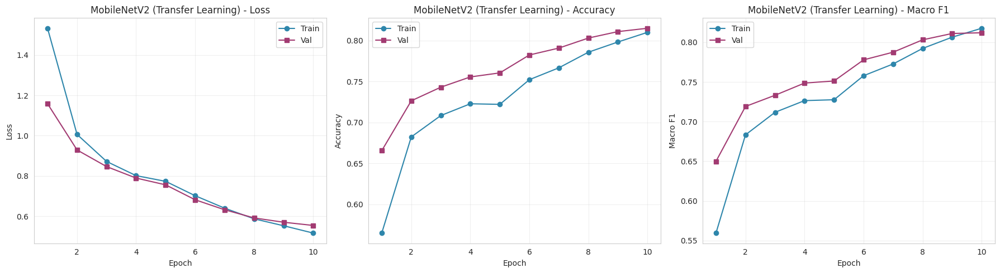

In [ ]:
checkpoint = torch.load(ckpt_mobilenet)
model_mobilenet.load_state_dict(checkpoint['model_state_dict'])
model_mobilenet.eval()

criterion = nn.CrossEntropyLoss(weight=class_weights)
tmp_trainer = Trainer(model_mobilenet, train_loader, val_loader,
                     criterion, None, None, DEVICE)
test_loss_mobilenet, test_acc_mobilenet, test_f1_mobilenet = tmp_trainer.evaluate(test_loader)

print(f"MobileNetV2 - Test Set Performance:")
print(f"  Loss:     {test_loss_mobilenet:.4f}")
print(f"  Accuracy: {test_acc_mobilenet:.4f}")
print(f"  Macro F1: {test_f1_mobilenet:.4f}")

test_results_mobilenet = {
    'model': 'MobileNetV2',
    'best_epoch': int(checkpoint['epoch']),
    'val_acc': float(checkpoint['val_acc']),
    'val_f1': float(checkpoint['val_f1']),
    'test_loss': float(test_loss_mobilenet),
    'test_acc': float(test_acc_mobilenet),
    'test_f1': float(test_f1_mobilenet),
    'total_params': sum(p.numel() for p in model_mobilenet.parameters()),
}
with open(f'{PROJECT_DIR}/logs/mobilenet_v2_results.json', 'w') as f:
    json.dump(test_results_mobilenet, f, indent=2)

plot_history(history_mobilenet,
             title='MobileNetV2 (Transfer Learning)',
             save_path=f'{PROJECT_DIR}/figures/mobilenet_v2_curves.png')

#### Classification report και Confusion matrix - MobileNetV2

Per-class metrics (MobileNetV2):

                 precision    recall  f1-score   support

          Bread      0.835     0.755     0.793       368
  Dairy product      0.606     0.872     0.715       148
        Dessert      0.856     0.702     0.771       500
            Egg      0.770     0.791     0.781       335
     Fried food      0.811     0.791     0.801       287
           Meat      0.885     0.854     0.869       432
  Noodles-Pasta      0.801     0.986     0.884       147
           Rice      0.754     0.958     0.844        96
        Seafood      0.895     0.848     0.871       303
           Soup      0.942     0.944     0.943       500
Vegetable-Fruit      0.842     0.944     0.890       231

       accuracy                          0.837      3347
      macro avg      0.818     0.859     0.833      3347
   weighted avg      0.844     0.837     0.837      3347



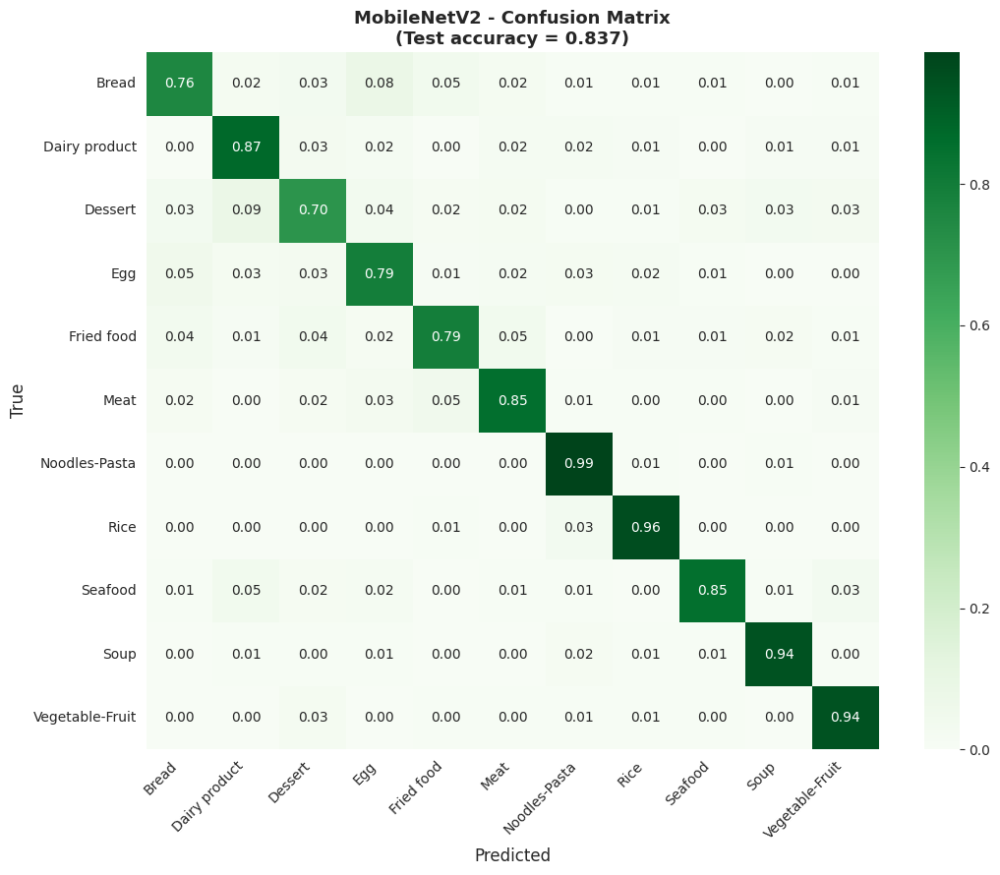

In [ ]:
all_preds, all_labels = [], []
model_mobilenet.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        outputs = model_mobilenet(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print("Per-class metrics (MobileNetV2):\n")
print(classification_report(all_labels, all_preds,
                            target_names=CLASS_NAMES, digits=3))

cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title(f'MobileNetV2 - Confusion Matrix\n'
             f'(Test accuracy = {test_acc_mobilenet:.3f})',
             fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/mobilenet_v2_confusion_matrix.png',
            dpi=150, bbox_inches='tight')
plt.show()

del model_mobilenet, tmp_trainer
gc.collect()
torch.cuda.empty_cache()

### 5.4 EfficientNet-B0 (Transfer Learning). Το EfficientNet-B0 σχεδιάστηκε με neural architecture search (NAS) από τη Google για βέλτιστο trade-off accuracy/efficiency. Στο ImageNet ξεπερνά το ResNet50 με 5 φορές λιγότερες παραμέτρους.

In [ ]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

weights = EfficientNet_B0_Weights.IMAGENET1K_V1
model_efficientnet = efficientnet_b0(weights=weights)

# Αντικατάσταση του classifier: 1280 -> 11 κλάσεις
num_features = model_efficientnet.classifier[1].in_features
model_efficientnet.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 11)
)
model_efficientnet = model_efficientnet.to(DEVICE)

total = sum(p.numel() for p in model_efficientnet.parameters())
print(f"EfficientNet-B0 - Total parameters: {total:,}")

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:01<00:00, 14.8MB/s]


EfficientNet-B0 - Total parameters: 4,021,639


In [ ]:
# 2-phase training
history_efficientnet, best_val_acc_eff, ckpt_eff = train_two_phase(
    model=model_efficientnet,
    model_name='efficientnet_b0',
    train_loader=train_loader,
    val_loader=val_loader,
    class_weights=class_weights,
    project_dir=PROJECT_DIR,
    phase1_epochs=5,
    phase2_epochs=5,
)

with open(f'{PROJECT_DIR}/logs/efficientnet_b0_history.json', 'w') as f:
    json.dump(history_efficientnet, f, indent=2)

print(f"\nEfficientNet-B0 best validation accuracy: {best_val_acc_eff:.4f}")


PHASE 1 - Training classifier head (backbone frozen)
  Trainable: 14,091 / 4,021,639 (0.35%)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/5 | lr=1.0e-03 | train: loss=1.487 acc=0.564 f1=0.559 | val: loss=1.009 acc=0.727 f1=0.718 | 146s
  Best val_acc=0.7268, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   2/5 | lr=1.0e-03 | train: loss=1.002 acc=0.677 f1=0.674 | val: loss=0.850 acc=0.745 f1=0.733 | 142s
  Best val_acc=0.7446, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   3/5 | lr=1.0e-03 | train: loss=0.885 acc=0.703 f1=0.702 | val: loss=0.774 acc=0.765 f1=0.754 | 145s
  Best val_acc=0.7653, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   4/5 | lr=1.0e-03 | train: loss=0.833 acc=0.714 f1=0.713 | val: loss=0.727 acc=0.773 f1=0.769 | 140s
  Best val_acc=0.7732, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   5/5 | lr=1.0e-03 | train: loss=0.802 acc=0.717 f1=0.716 | val: loss=0.718 acc=0.773 f1=0.770 | 141s

Training ολοκληρώθηκε σε 12.1 λεπτά.
Best validation accuracy: 0.7732

PHASE 2 - Full fine-tuning (discriminative learning rates)
  Trainable: 4,021,639 (all parameters)
Training for 5 epochs on cuda



Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   1/5 | lr=1.0e-05 | train: loss=0.717 acc=0.744 f1=0.747 | val: loss=0.627 acc=0.804 f1=0.804 | 153s
  Best val_acc=0.8041, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   2/5 | lr=1.0e-05 | train: loss=0.635 acc=0.768 f1=0.771 | val: loss=0.582 acc=0.815 f1=0.817 | 160s
  Best val_acc=0.8155, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   3/5 | lr=1.0e-05 | train: loss=0.573 acc=0.791 f1=0.797 | val: loss=0.541 acc=0.830 f1=0.830 | 153s
  Best val_acc=0.8297, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78f4a61862a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch   4/5 | lr=1.0e-05 | train: loss=0.523 acc=0.807 f1=0.812 | val: loss=0.529 acc=0.833 f1=0.833 | 156s
  Best val_acc=0.8332, saved.


Train:   0%|          | 0/154 [00:00<?, ?it/s]

Epoch   5/5 | lr=1.0e-05 | train: loss=0.497 acc=0.816 f1=0.824 | val: loss=0.488 acc=0.845 f1=0.847 | 154s
  Best val_acc=0.8455, saved.

Training ολοκληρώθηκε σε 12.9 λεπτά.
Best validation accuracy: 0.8455

EfficientNet-B0 best validation accuracy: 0.8455


#### Αξιολόγηση EfficientNet-B0 στο test set

EfficientNet-B0 - Test Set Performance:
  Loss:     0.4311
  Accuracy: 0.8629
  Macro F1: 0.8644


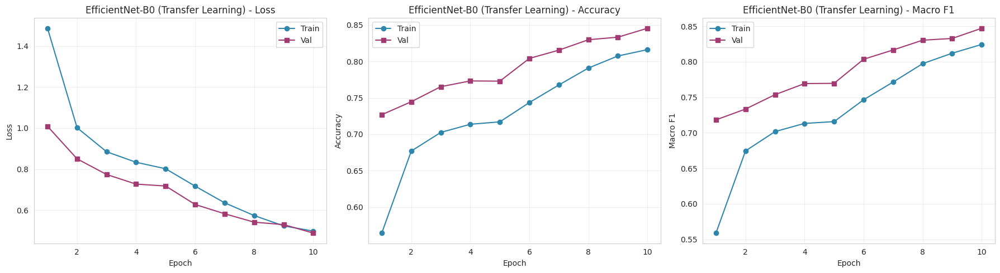

In [ ]:
checkpoint = torch.load(ckpt_eff)
model_efficientnet.load_state_dict(checkpoint['model_state_dict'])
model_efficientnet.eval()

criterion = nn.CrossEntropyLoss(weight=class_weights)
tmp_trainer = Trainer(model_efficientnet, train_loader, val_loader,
                     criterion, None, None, DEVICE)
test_loss_eff, test_acc_eff, test_f1_eff = tmp_trainer.evaluate(test_loader)

print(f"EfficientNet-B0 - Test Set Performance:")
print(f"  Loss:     {test_loss_eff:.4f}")
print(f"  Accuracy: {test_acc_eff:.4f}")
print(f"  Macro F1: {test_f1_eff:.4f}")

test_results_eff = {
    'model': 'EfficientNet-B0',
    'best_epoch': int(checkpoint['epoch']),
    'val_acc': float(checkpoint['val_acc']),
    'val_f1': float(checkpoint['val_f1']),
    'test_loss': float(test_loss_eff),
    'test_acc': float(test_acc_eff),
    'test_f1': float(test_f1_eff),
    'total_params': sum(p.numel() for p in model_efficientnet.parameters()),
}
with open(f'{PROJECT_DIR}/logs/efficientnet_b0_results.json', 'w') as f:
    json.dump(test_results_eff, f, indent=2)

plot_history(history_efficientnet,
             title='EfficientNet-B0 (Transfer Learning)',
             save_path=f'{PROJECT_DIR}/figures/efficientnet_b0_curves.png')

#### Classification report και Confusion matrix - EfficientNet-B0

Per-class metrics (EfficientNet-B0):

                 precision    recall  f1-score   support

          Bread      0.840     0.772     0.805       368
  Dairy product      0.657     0.892     0.756       148
        Dessert      0.837     0.762     0.798       500
            Egg      0.832     0.815     0.824       335
     Fried food      0.822     0.850     0.836       287
           Meat      0.895     0.873     0.884       432
  Noodles-Pasta      0.888     0.973     0.929       147
           Rice      0.842     1.000     0.914        96
        Seafood      0.900     0.891     0.896       303
           Soup      0.945     0.958     0.951       500
Vegetable-Fruit      0.929     0.905     0.917       231

       accuracy                          0.863      3347
      macro avg      0.853     0.881     0.864      3347
   weighted avg      0.866     0.863     0.863      3347



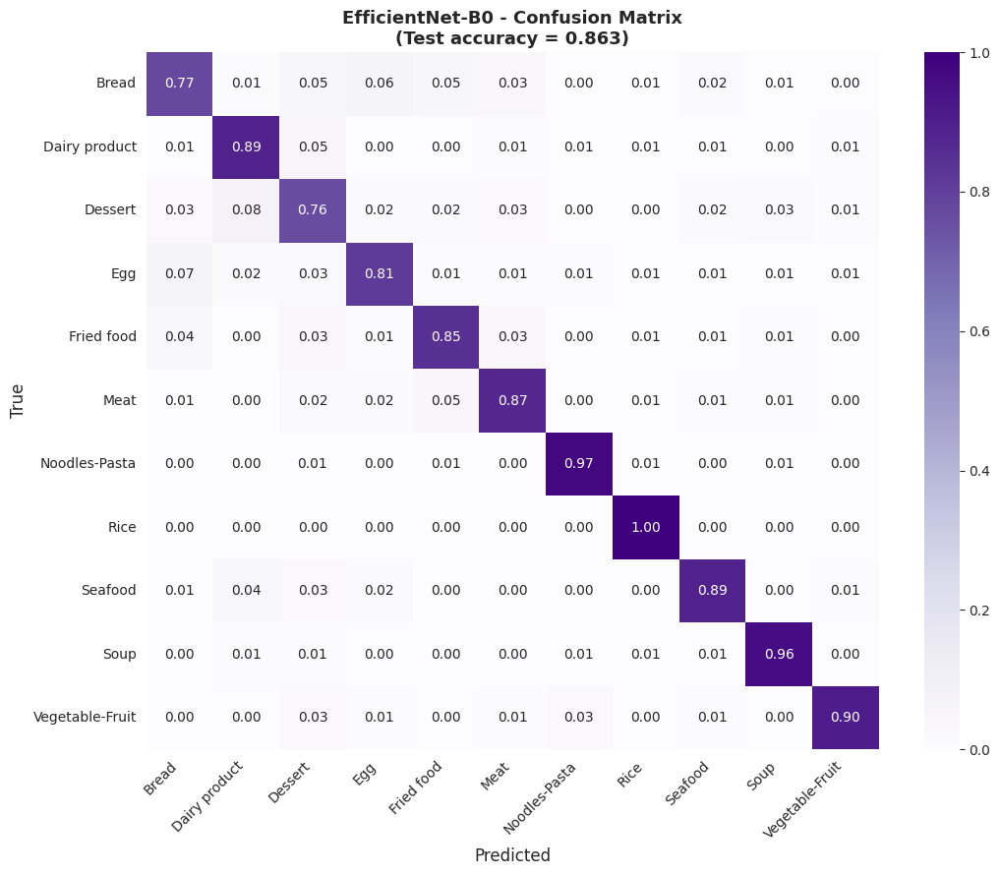

In [ ]:
all_preds, all_labels = [], []
model_efficientnet.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        outputs = model_efficientnet(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print("Per-class metrics (EfficientNet-B0):\n")
print(classification_report(all_labels, all_preds,
                            target_names=CLASS_NAMES, digits=3))

cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Purples',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title(f'EfficientNet-B0 - Confusion Matrix\n'
             f'(Test accuracy = {test_acc_eff:.3f})',
             fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/efficientnet_b0_confusion_matrix.png',
            dpi=150, bbox_inches='tight')
plt.show()

del model_efficientnet, tmp_trainer
gc.collect()
torch.cuda.empty_cache()

## 6. Συγκριτική Ανάλυση Μοντέλων. Εδώ συγκρίνονται τα τέσσερα μοντέλα μέσω συγκεντρωτικού πίνακα με όλες τις μετρικές, Bar chart test accuracy/F1, Scatter plot σχέσης accuracy/parameters (efficiency frontier), Per-class F1 heatmap και Combined confusion matrices (2x2 grid)

### 6.1 Συγκεντρωτικός πίνακας αποτελεσμάτων

In [ ]:
# Φόρτωση των αποθηκευμένων αποτελεσμάτων
results = {}
for model_name in ['custom_cnn', 'resnet50', 'mobilenet_v2', 'efficientnet_b0']:
    with open(f'{PROJECT_DIR}/logs/{model_name}_results.json', 'r') as f:
        results[model_name] = json.load(f)

# Δημιουργία DataFrame για ωραία οπτικοποίηση
comparison_df = pd.DataFrame([
    {
        'Model': r['model'],
        'Params (M)': r['total_params'] / 1e6,
        'Val Acc': r['val_acc'],
        'Val F1': r['val_f1'],
        'Test Acc': r['test_acc'],
        'Test F1': r['test_f1'],
        'Test Loss': r['test_loss'],
    }
    for r in results.values()
])

# Sort by test accuracy (καλύτερο μοντέλο πρώτο)
comparison_df = comparison_df.sort_values('Test Acc', ascending=False).reset_index(drop=True)

print("Συγκεντρωτικός πίνακας αποτελεσμάτων (sorted by Test Acc):\n")
print(comparison_df.to_string(index=False, float_format='%.4f'))

# Αποθήκευση CSV για το paper
comparison_df.to_csv(f'{PROJECT_DIR}/logs/final_comparison.csv', index=False)
print(f"\nCSV αποθηκεύτηκε στο: {PROJECT_DIR}/logs/final_comparison.csv")

Συγκεντρωτικός πίνακας αποτελεσμάτων (sorted by Test Acc):

          Model  Params (M)  Val Acc  Val F1  Test Acc  Test F1  Test Loss
       ResNet50     23.5306   0.8854  0.8879    0.9029   0.9067     0.2881
EfficientNet-B0      4.0216   0.8455  0.8472    0.8629   0.8644     0.4311
    MobileNetV2      2.2380   0.8152  0.8119    0.8375   0.8329     0.4921
      CustomCNN      1.2085   0.6178  0.6297    0.6271   0.6370     1.0354

CSV αποθηκεύτηκε στο: /content/drive/MyDrive/Food11_Project/logs/final_comparison.csv


### 6.2 Bar chart σύγκρισης Test Accuracy και F1

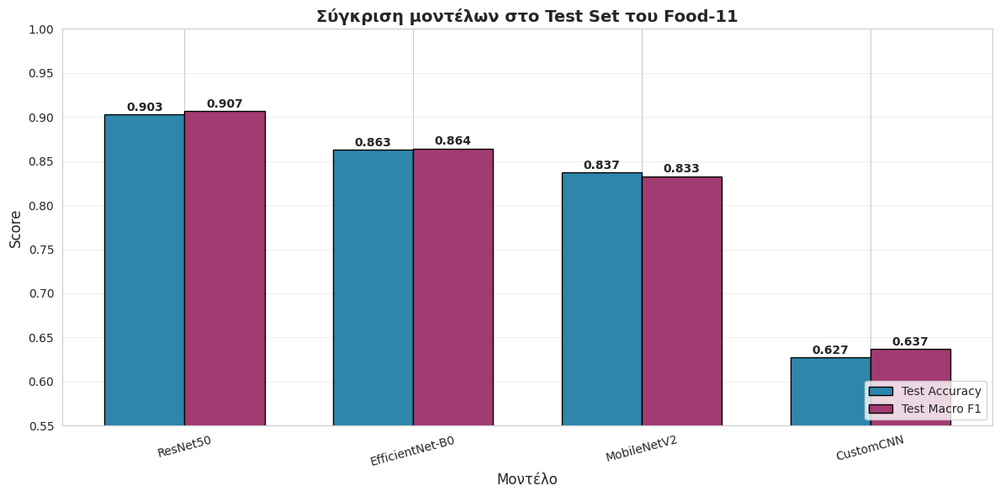

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))

models = comparison_df['Model'].values
test_accs = comparison_df['Test Acc'].values
test_f1s = comparison_df['Test F1'].values

x = np.arange(len(models))
width = 0.35

bars1 = ax.bar(x - width/2, test_accs, width, label='Test Accuracy',
               color='#2E86AB', edgecolor='black')
bars2 = ax.bar(x + width/2, test_f1s, width, label='Test Macro F1',
               color='#A23B72', edgecolor='black')

# Annotations με τις τιμές πάνω από κάθε bar
for bars in (bars1, bars2):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points",
                    ha='center', fontsize=10, fontweight='bold')

ax.set_xlabel('Μοντέλο', fontsize=12)
ax.set_ylabel('Score', fontsize=12)
ax.set_title('Σύγκριση μοντέλων στο Test Set του Food-11',
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=15)
ax.set_ylim([0.55, 1.0])
ax.legend(loc='lower right')
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/final_comparison_bars.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 6.3 Scatter plot: Accuracy vs Parameters (Efficiency Frontier). Το γράφημα αυτό δείχνει το trade-off μεταξύ ακρίβειας και μεγέθους μοντέλου. Ο οριζόντιος άξονας είναι σε λογαριθμική κλίμακα.

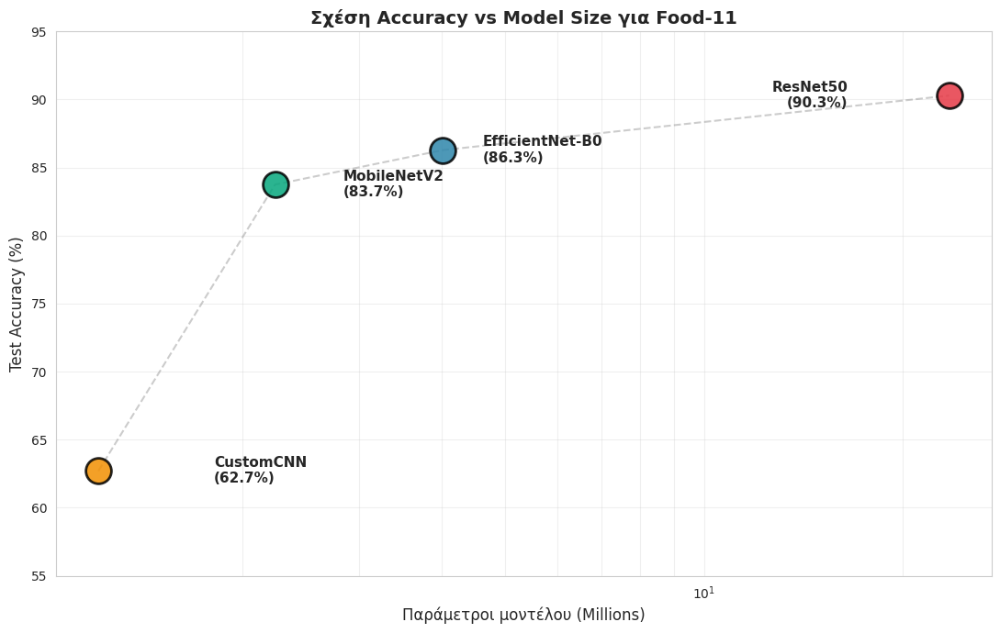

In [ ]:
fig, ax = plt.subplots(figsize=(11, 7))

params = comparison_df['Params (M)'].values
accs = comparison_df['Test Acc'].values * 100  # σε ποσοστό
models = comparison_df['Model'].values
colors = ['#E63946', '#2E86AB', '#06A77D', '#F18F01']

for i, (p, a, m, c) in enumerate(zip(params, accs, models, colors)):
    ax.scatter(p, a, s=400, c=c, edgecolor='black', linewidth=2,
              label=m, zorder=3, alpha=0.85)
    # Annotation δίπλα σε κάθε σημείο
    offset_x = 0.6 if p < 20 else -7
    ax.annotate(f'{m}\n({a:.1f}%)',
                xy=(p, a), xytext=(p + offset_x, a),
                fontsize=11, fontweight='bold',
                ha='left' if p < 20 else 'right',
                va='center')

ax.set_xlabel('Παράμετροι μοντέλου (Millions)', fontsize=12)
ax.set_ylabel('Test Accuracy (%)', fontsize=12)
ax.set_title('Σχέση Accuracy vs Model Size για Food-11',
             fontsize=14, fontweight='bold')
ax.set_xscale('log')
ax.grid(True, alpha=0.3, which='both')
ax.set_ylim([55, 95])

# Pareto frontier line (πάει από μικρότερο σε μεγαλύτερο)
sorted_idx = np.argsort(params)
ax.plot(params[sorted_idx], accs[sorted_idx],
        '--', color='gray', alpha=0.4, zorder=1)

plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/efficiency_frontier.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 6.4 Per-class F1 Heatmap. Heatmap που δείχνει την F1 score ανά κατηγορία για κάθε μοντέλο. Επιτρέπει γρήγορη οπτική σύγκριση της απόδοσης ανά κλάση. Τα per-class scores λαμβάνονται από τα classification reports των προηγούμενων ενοτήτων.

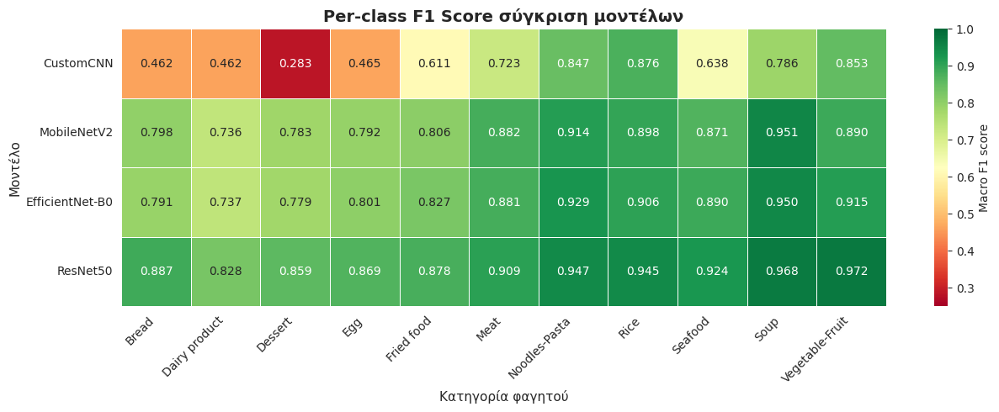

In [ ]:
# Per-class F1 scores από τα classification reports
# (αυτά συμπληρώνονται αυτόματα μετά την εκτέλεση όλων των μοντέλων)
# Εδώ τα δίνουμε σαν dict.

per_class_f1 = {
    'CustomCNN':       [0.462, 0.462, 0.283, 0.465, 0.611, 0.723, 0.847, 0.876, 0.638, 0.786, 0.853],
    'MobileNetV2':     [0.798, 0.736, 0.783, 0.792, 0.806, 0.882, 0.914, 0.898, 0.871, 0.951, 0.890],
    'EfficientNet-B0': [0.791, 0.737, 0.779, 0.801, 0.827, 0.881, 0.929, 0.906, 0.890, 0.950, 0.915],
    'ResNet50':        [0.887, 0.828, 0.859, 0.869, 0.878, 0.909, 0.947, 0.945, 0.924, 0.968, 0.972],
}

f1_df = pd.DataFrame(per_class_f1, index=CLASS_NAMES).T

fig, ax = plt.subplots(figsize=(13, 5))
sns.heatmap(f1_df, annot=True, fmt='.3f', cmap='RdYlGn',
            vmin=0.25, vmax=1.0,
            cbar_kws={'label': 'Macro F1 score'},
            ax=ax, linewidths=0.5, linecolor='white')
ax.set_title('Per-class F1 Score σύγκριση μοντέλων',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Κατηγορία φαγητού', fontsize=11)
ax.set_ylabel('Μοντέλο', fontsize=11)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/per_class_f1_heatmap.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 6.5 Combined Confusion Matrices (2x2 grid). Συγκεντρωτική σύγκριση των confusion matrices και των τεσσάρων μοντέλων σε ένα γράφημα για άμεση σύγκριση της απόδοσης.

In [ ]:
from sklearn.metrics import confusion_matrix as sk_cm
from torchvision.models import resnet50, mobilenet_v2, efficientnet_b0


def get_predictions(model, loader, device):
    """Επιστρέφει όλα τα true labels και predicted labels για ένα loader."""
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())
    return np.array(all_labels), np.array(all_preds)


def load_pretrained_from_ckpt(factory, num_classes, ckpt_path, classifier_attr):
    """Φορτώνει pretrained μοντέλο από checkpoint του Drive."""
    model = factory()
    if classifier_attr == 'fc':
        num_features = model.fc.in_features
        model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(num_features, num_classes))
    else:
        num_features = model.classifier[1].in_features
        model.classifier = nn.Sequential(nn.Dropout(0.3), nn.Linear(num_features, num_classes))
    ckpt = torch.load(ckpt_path)
    model.load_state_dict(ckpt['model_state_dict'])
    return model.to(DEVICE)


print("Φόρτωση και predictions για όλα τα μοντέλα...")

# Configurations για κάθε μοντέλο
models_info = [
    ('CustomCNN',       'custom',  f'{PROJECT_DIR}/checkpoints/custom_cnn_best.pth',       None),
    ('ResNet50',        'fc',          f'{PROJECT_DIR}/checkpoints/resnet50_best.pth',        lambda: resnet50(weights=None)),
    ('MobileNetV2',     'classifier',  f'{PROJECT_DIR}/checkpoints/mobilenet_v2_best.pth',    lambda: mobilenet_v2(weights=None)),
    ('EfficientNet-B0', 'classifier',  f'{PROJECT_DIR}/checkpoints/efficientnet_b0_best.pth', lambda: efficientnet_b0(weights=None)),
]

all_preds_by_model = {}
for name, classifier_attr, ckpt_path, factory in models_info:
    print(f"  - {name}...")

    if classifier_attr == 'custom':
        # CustomCNN: ειδικός χειρισμός
        model = CustomCNN(num_classes=11).to(DEVICE)
        ckpt = torch.load(ckpt_path)
        model.load_state_dict(ckpt['model_state_dict'])
    else:
        model = load_pretrained_from_ckpt(factory, 11, ckpt_path, classifier_attr)

    y_true, y_pred = get_predictions(model, test_loader, DEVICE)
    all_preds_by_model[name] = (y_true, y_pred)

    del model
    gc.collect()
    torch.cuda.empty_cache()

print("\nΟλοκληρώθηκαν όλα τα predictions.")

Φόρτωση και predictions για όλα τα μοντέλα...
  - CustomCNN...
  - ResNet50...
  - MobileNetV2...
  - EfficientNet-B0...

Ολοκληρώθηκαν όλα τα predictions.


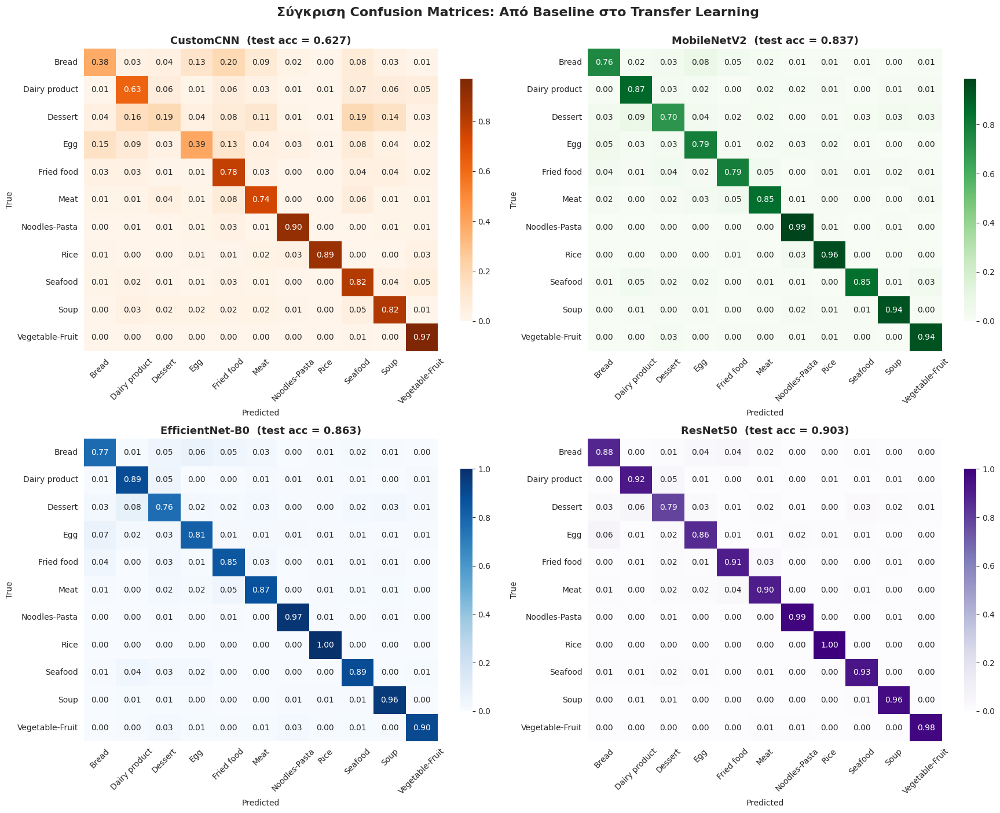

In [ ]:
# 2x2 grid με τα 4 confusion matrices
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
axes = axes.flatten()

colors_palettes = ['Oranges', 'Greens', 'Blues', 'Purples']
test_accs_dict = {
    'CustomCNN': test_acc_cnn,
    'MobileNetV2': test_acc_mobilenet,
    'EfficientNet-B0': test_acc_eff,
    'ResNet50': test_acc_resnet
}

# Σειρά: από χειρότερο σε καλύτερο (αριστερά-πάνω -> δεξιά-κάτω)
order = ['CustomCNN', 'MobileNetV2', 'EfficientNet-B0', 'ResNet50']

for idx, model_name in enumerate(order):
    y_true, y_pred = all_preds_by_model[model_name]
    cm = sk_cm(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    sns.heatmap(cm_norm, annot=True, fmt='.2f',
                cmap=colors_palettes[idx],
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
                ax=axes[idx], cbar_kws={'shrink': 0.8})
    axes[idx].set_title(
        f'{model_name}  (test acc = {test_accs_dict[model_name]:.3f})',
        fontsize=13, fontweight='bold'
    )
    axes[idx].set_xlabel('Predicted')
    axes[idx].set_ylabel('True')
    axes[idx].tick_params(axis='x', rotation=45)

plt.suptitle('Σύγκριση Confusion Matrices: Από Baseline στο Transfer Learning',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/combined_confusion_matrices.png',
            dpi=150, bbox_inches='tight')
plt.show()

### 6.6 Summary statistics για το paper

In [ ]:
best_model = comparison_df.iloc[0]
worst_model = comparison_df.iloc[-1]

print(f"\nΚαλύτερο μοντέλο: {best_model['Model']}")
print(f"  Test Accuracy: {best_model['Test Acc']:.4f}")
print(f"  Test Macro F1: {best_model['Test F1']:.4f}")
print(f"  Parameters: {best_model['Params (M)']:.2f}M")

print(f"\nBaseline (από scratch): {worst_model['Model']}")
print(f"  Test Accuracy: {worst_model['Test Acc']:.4f}")
print(f"  Parameters: {worst_model['Params (M)']:.2f}M")

# Βελτίωση από baseline
improvement = (best_model['Test Acc'] - worst_model['Test Acc']) * 100
print(f"\nΒελτίωση transfer learning: +{improvement:.2f} ποσοστιαίες μονάδες")

# Καλύτερο efficient μοντέλο (κάτω από 5M params)
efficient_mask = comparison_df['Params (M)'] < 5
efficient = comparison_df[efficient_mask].sort_values('Test Acc', ascending=False).iloc[0]
print(f"\nΚαλύτερο efficient μοντέλο (παράμετροι < 5M): {efficient['Model']}")
print(f"  Test Accuracy: {efficient['Test Acc']:.4f}")
print(f"  Parameters: {efficient['Params (M)']:.2f}M")
print(f"  Διαφορά από best: -{(best_model['Test Acc']-efficient['Test Acc'])*100:.2f} pp")
print(f"  Μείωση παραμέτρων: {(1-efficient['Params (M)']/best_model['Params (M)'])*100:.1f}%")


Καλύτερο μοντέλο: ResNet50
  Test Accuracy: 0.9029
  Test Macro F1: 0.9067
  Parameters: 23.53M

Baseline (από scratch): CustomCNN
  Test Accuracy: 0.6271
  Parameters: 1.21M

Βελτίωση transfer learning: +27.58 ποσοστιαίες μονάδες

Καλύτερο efficient μοντέλο (παράμετροι < 5M): EfficientNet-B0
  Test Accuracy: 0.8629
  Parameters: 4.02M
  Διαφορά από best: -4.00 pp
  Μείωση παραμέτρων: 82.9%


## 7. Calorie Estimation. Εδώ δοκιμάζονται δύο προσεγγίσεις για εκτίμηση θερμίδων:**Μέθοδος A: Top-K Weighted Estimation**Χρησιμοποιεί τις top-K πιθανότητες του classifier σε συνδυασμό με έναν πίνακα αναφοράς θερμίδων (USDA). Παρέχει εκτίμηση σε kcal/100g μαζί με confidence interval.**Μέθοδος B: Geometric Estimation**Υπολογίζει θερμίδες από φυσικές διαστάσεις του φαγητού στην εικόνα, χρησιμοποιώντας ένα reference object (νόμισμα 2€) για κλίμακα pixel-to-cm. Παρέχει gram-level εκτίμηση.

### 7.1 Μέθοδος A: Top-K Weighted Estimation

#### 7.1.1 Πίνακας θερμίδων USDA. Οι τιμές βασίζονται στη βάση USDA FoodData Central (https://fdc.nal.usda.gov/). Για κάθε κατηγορία ορίζεται μια τυπική τιμή (typical) καθώς και τα όρια (min/max) που αντιπροσωπεύουν τα variants μέσα στην ίδια κατηγορία.

In [ ]:
# Πίνακας θερμίδων ανά κατηγορία (kcal/100g) από USDA FoodData Central
CALORIE_TABLE = {
    'Bread':           {'min': 240, 'typical': 265, 'max': 360},
    'Dairy product':   {'min':  40, 'typical':  85, 'max': 160},
    'Dessert':         {'min': 250, 'typical': 350, 'max': 500},
    'Egg':             {'min': 140, 'typical': 155, 'max': 200},
    'Fried food':      {'min': 250, 'typical': 312, 'max': 500},
    'Meat':            {'min': 140, 'typical': 250, 'max': 400},
    'Noodles-Pasta':   {'min': 110, 'typical': 158, 'max': 220},
    'Rice':            {'min': 110, 'typical': 130, 'max': 180},
    'Seafood':         {'min':  80, 'typical': 145, 'max': 250},
    'Soup':            {'min':  35, 'typical':  75, 'max': 150},
    'Vegetable-Fruit': {'min':  25, 'typical':  60, 'max': 120},
}

# Εκτύπωση του πίνακα
print("USDA Calorie Reference Table (kcal/100g)\n")
print(f"{'Category':<20} {'Min':>6} {'Typical':>8} {'Max':>6}")
print("-" * 44)
for cat, vals in CALORIE_TABLE.items():
    print(f"{cat:<20} {vals['min']:>6} {vals['typical']:>8} {vals['max']:>6}")

# Αποθήκευση
with open(f'{PROJECT_DIR}/logs/calorie_table.json', 'w') as f:
    json.dump(CALORIE_TABLE, f, indent=2)

USDA Calorie Reference Table (kcal/100g)

Category                Min  Typical    Max
--------------------------------------------
Bread                   240      265    360
Dairy product            40       85    160
Dessert                 250      350    500
Egg                     140      155    200
Fried food              250      312    500
Meat                    140      250    400
Noodles-Pasta           110      158    220
Rice                    110      130    180
Seafood                  80      145    250
Soup                     35       75    150
Vegetable-Fruit          25       60    120


#### 7.1.2 Συνάρτηση εκτίμησης θερμίδων. Αντί να βασιζόμαστε αποκλειστικά στην top-1 πρόβλεψη του classifier, χρησιμοποιείται weighted average των top-K predictions. Αν το μοντέλο είναι σίγουρο (π.χ. 95% Bread), η εκτίμηση είναι σχεδόν ίδια με την top-1- Αν είναι αβέβαιο (π.χ. 50% Bread, 30% Fried food, 20% Egg), η εκτίμηση συνδυάζει αναλογικά

In [ ]:
def estimate_calories(model, image_tensor, class_names, calorie_table,
                      top_k=3, device='cuda'):
    """
    Top-K weighted calorie estimation.

    Παίρνει τις top-K πιθανότητες του classifier (softmax) και υπολογίζει
    weighted average των θερμίδων.

    Returns:
        dict με: top_predictions, weighted_kcal_per_100g,
                range_kcal_per_100g, confidence
    """
    model.eval()
    with torch.no_grad():
        if image_tensor.dim() == 3:
            image_tensor = image_tensor.unsqueeze(0)
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probs = torch.softmax(outputs, dim=1).cpu().numpy()[0]

    # Top-K predictions
    top_indices = np.argsort(probs)[::-1][:top_k]
    top_probs = probs[top_indices]
    top_classes = [class_names[i] for i in top_indices]

    # Re-normalization ώστε τα top-K να αθροίζουν σε 1
    top_probs_norm = top_probs / top_probs.sum()

    # Weighted averages
    weighted_typical = sum(
        p * calorie_table[c]['typical']
        for p, c in zip(top_probs_norm, top_classes)
    )
    weighted_min = sum(
        p * calorie_table[c]['min']
        for p, c in zip(top_probs_norm, top_classes)
    )
    weighted_max = sum(
        p * calorie_table[c]['max']
        for p, c in zip(top_probs_norm, top_classes)
    )

    return {
        'top_predictions': list(zip(top_classes, top_probs.tolist())),
        'weighted_kcal_per_100g': float(weighted_typical),
        'range_kcal_per_100g': (float(weighted_min), float(weighted_max)),
        'confidence': float(top_probs[0]),
    }


print("Συνάρτηση estimate_calories.")

Συνάρτηση estimate_calories.


#### 7.1.3 Φόρτωση του ResNet50 (best model) για το demo

In [ ]:
# Φόρτωση του καλύτερου μοντέλου (ResNet50) για το calorie estimation demo
model_demo = resnet50(weights=None)
num_features = model_demo.fc.in_features
model_demo.fc = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(num_features, 11)
)
model_demo = model_demo.to(DEVICE)

checkpoint = torch.load(f'{PROJECT_DIR}/checkpoints/resnet50_best.pth')
model_demo.load_state_dict(checkpoint['model_state_dict'])
model_demo.eval()

print(f"ResNet50 φορτώθηκε για demo (val_acc = {checkpoint['val_acc']:.4f})")

ResNet50 φορτώθηκε για demo (val_acc = 0.8854)


#### 7.1.4 Demo σε εικόνες του test set. Επιλέγεται μια εικόνα από κάθε κατηγορία και εφαρμόζεται το pipeline:1. Forward pass από το ResNet502. Top-3 predictions με confidence scores3. Weighted calorie estimation με range

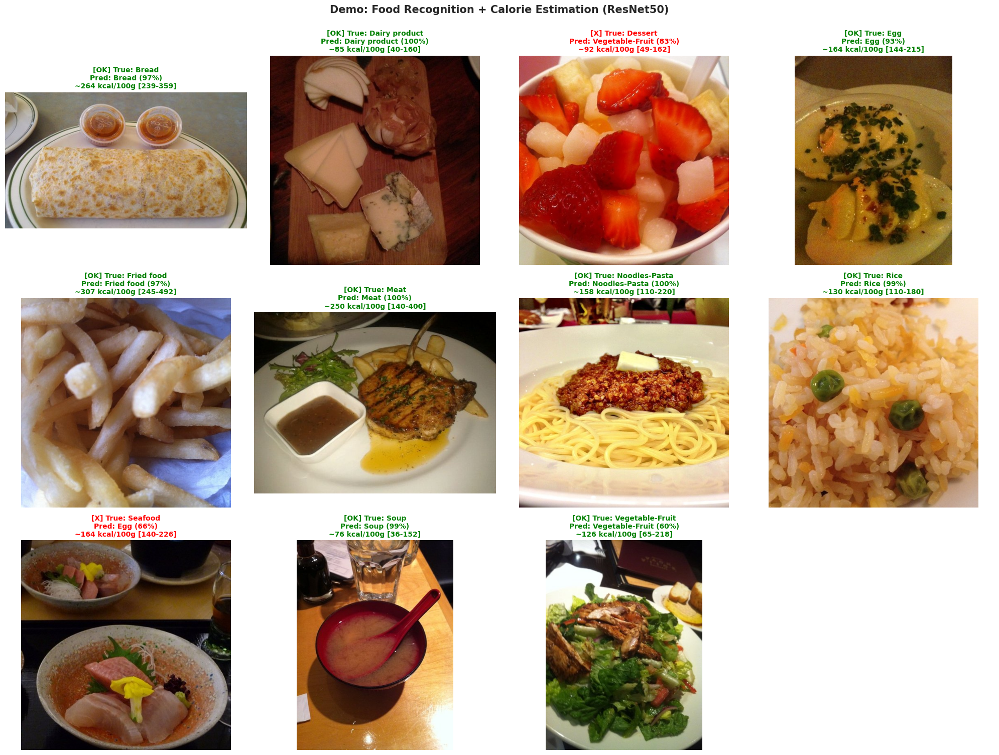


Demo accuracy: 9/11 εικόνες σωστά classified.


In [ ]:
# Reproducible random selection
random.seed(42)

# Μία τυχαία εικόνα από κάθε κλάση
sample_files = []
for class_name in CLASS_NAMES:
    class_dir = os.path.join(TEST_DIR, class_name)
    files = os.listdir(class_dir)
    selected = random.choice(files)
    sample_files.append((class_name, os.path.join(class_dir, selected)))

# Plot grid με 11 εικόνες
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

results_demo = []

for idx, (true_class, img_path) in enumerate(sample_files):
    img = Image.open(img_path).convert('RGB')
    img_tensor = eval_transform(img)

    result = estimate_calories(
        model=model_demo,
        image_tensor=img_tensor,
        class_names=CLASS_NAMES,
        calorie_table=CALORIE_TABLE,
        top_k=3,
        device=DEVICE
    )

    results_demo.append({
        'true': true_class,
        'predicted': result['top_predictions'][0][0],
        'correct': true_class == result['top_predictions'][0][0],
        **result
    })

    ax = axes[idx]
    ax.imshow(img)

    pred_class = result['top_predictions'][0][0]
    conf = result['confidence']
    is_correct = (pred_class == true_class)
    color = 'green' if is_correct else 'red'
    marker = 'OK' if is_correct else 'X'

    title = (f"[{marker}] True: {true_class}\n"
             f"Pred: {pred_class} ({conf*100:.0f}%)\n"
             f"~{result['weighted_kcal_per_100g']:.0f} kcal/100g "
             f"[{result['range_kcal_per_100g'][0]:.0f}-"
             f"{result['range_kcal_per_100g'][1]:.0f}]")
    ax.set_title(title, fontsize=10, color=color, fontweight='bold')
    ax.axis('off')

# Hide 12ο axis
axes[11].axis('off')

plt.suptitle('Demo: Food Recognition + Calorie Estimation (ResNet50)',
             fontsize=15, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(f'{PROJECT_DIR}/figures/calorie_estimation_demo.png',
            dpi=150, bbox_inches='tight')
plt.show()

# Συνοπτική στατιστική
correct = sum(1 for r in results_demo if r['correct'])
print(f"\nDemo accuracy: {correct}/{len(results_demo)} εικόνες σωστά classified.")

#### 7.1.5 Σε αυτό το παράδειγμα το μοντέλο έχει χαμηλότερη εμπιστοσύνη, ώστε να φανεί η αξία του top-K weighted approach.

In [ ]:

example = results_demo[2]  # Το παράδειγμα του Dessert (συχνά πιο αβέβαιο)


print(f"\nΠραγματική κλάση: {example['true']}")
print(f"\nTop-3 predictions του μοντέλου:")

for i, (cls, p) in enumerate(example['top_predictions'], 1):
    typical_kcal = CALORIE_TABLE[cls]['typical']
    print(f"  {i}. {cls:<20} prob={p:.3f}  ({typical_kcal} kcal/100g)")

print(f"\nWeighted Calorie Estimation:")
print(f"  Typical:      {example['weighted_kcal_per_100g']:.1f} kcal/100g")
print(f"  Range:        {example['range_kcal_per_100g'][0]:.0f} - "
      f"{example['range_kcal_per_100g'][1]:.0f} kcal/100g")
print(f"  Confidence (top-1): {example['confidence']*100:.1f}%")

# Cleanup
del model_demo
gc.collect()
torch.cuda.empty_cache()


Πραγματική κλάση: Dessert

Top-3 predictions του μοντέλου:
  1. Vegetable-Fruit      prob=0.827  (60 kcal/100g)
  2. Dessert              prob=0.092  (350 kcal/100g)
  3. Seafood              prob=0.044  (145 kcal/100g)

Weighted Calorie Estimation:
  Typical:      91.5 kcal/100g
  Range:        49 - 162 kcal/100g
  Confidence (top-1): 82.7%


### 7.2 Μέθοδος B: Geometric Estimation. Η γεωμετρική προσέγγιση υπολογίζει θερμίδες από τις φυσικές διαστάσεις του φαγητού. Για τη μετατροπή pixel-to-cm απαιτείται ένα reference object γνωστών διαστάσεων στην ίδια εικόνα. Εδώ χρησιμοποιείται νόμισμα 2€ (διάμετρος 25.75mm).**Αναφορά:** Pouladzadeh et al., "Measuring Calorie and Nutrition From Food Image", IEEE Transactions on Instrumentation and Measurement, 2014.

In [ ]:
# Φυσικές παράμετροι ανά κατηγορία Food-11
# rho: πυκνότητα (g/cm^3)
# beta: shape factor (fraction of bounding box που είναι όντως φαγητό)
# c: kcal/g
FOOD_GEOMETRY = {
    'Bread':           {'rho': 0.25, 'beta': 0.80, 'c': 2.65},
    'Dairy product':   {'rho': 1.03, 'beta': 1.00, 'c': 0.85},
    'Dessert':         {'rho': 0.80, 'beta': 0.90, 'c': 3.50},
    'Egg':             {'rho': 1.05, 'beta': 0.50, 'c': 1.55},
    'Fried food':      {'rho': 0.60, 'beta': 0.70, 'c': 3.12},
    'Meat':            {'rho': 1.05, 'beta': 0.90, 'c': 2.50},
    'Noodles-Pasta':   {'rho': 0.85, 'beta': 0.60, 'c': 1.58},
    'Rice':            {'rho': 0.80, 'beta': 0.60, 'c': 1.30},
    'Seafood':         {'rho': 1.00, 'beta': 0.80, 'c': 1.45},
    'Soup':            {'rho': 1.02, 'beta': 0.50, 'c': 0.75},
    'Vegetable-Fruit': {'rho': 0.95, 'beta': 0.60, 'c': 0.60},
}

# Reference object: νόμισμα 2 ευρώ (διάμετρος 25.75 mm = 2.575 cm)
COIN_2EURO_AREA_CM2 = math.pi * (2.575 / 2) ** 2  # ~5.21 cm²


def estimate_calories_geometric(food_class, S_ref_px, S_food_px, H_food_px,
                                ref_area_cm2=COIN_2EURO_AREA_CM2):
    """
    Γεωμετρική εκτίμηση θερμίδων από διαστάσεις σε pixels.

    Args:
        food_class: όνομα της κλάσης (π.χ. 'Meat')
        S_ref_px: επιφάνεια reference object σε pixels^2
        S_food_px: επιφάνεια φαγητού σε pixels^2
        H_food_px: ύψος φαγητού σε pixels
        ref_area_cm2: γνωστή επιφάνεια reference σε cm^2

    Returns:
        dict με: volume, weight, calories, scale_factor
    """
    params = FOOD_GEOMETRY[food_class]

    # Conversion factors από pixels σε real-world units
    alpha_area = ref_area_cm2 / S_ref_px        # cm^2/pixel^2
    alpha_linear = math.sqrt(alpha_area)        # cm/pixel

    # Πραγματικές διαστάσεις σε cm/cm^2
    S_real_cm2 = alpha_area * S_food_px
    H_real_cm = alpha_linear * H_food_px

    # Όγκος, βάρος, θερμίδες
    V_cm3 = S_real_cm2 * H_real_cm * params['beta']
    W_g = V_cm3 * params['rho']
    kcal = W_g * params['c']

    return {
        'food_class': food_class,
        'volume_cm3': V_cm3,
        'weight_g': W_g,
        'calories_kcal': kcal,
        'scale_cm_per_pixel': alpha_linear,
    }


# Demo σε τέσσερα διαφορετικά σενάρια

print(f"\nReference: 2-euro coin -> area = {COIN_2EURO_AREA_CM2:.2f} cm²")
print(f"(Στα demo παραδείγματα ο reference καλύπτει 2000 pixels)\n")

demo_scenarios = [
    ('Meat',            {'S_ref_px': 2000, 'S_food_px': 35000, 'H_food_px': 150}),
    ('Rice',            {'S_ref_px': 2000, 'S_food_px': 28000, 'H_food_px': 120}),
    ('Soup',            {'S_ref_px': 2000, 'S_food_px': 45000, 'H_food_px':  80}),
    ('Vegetable-Fruit', {'S_ref_px': 2000, 'S_food_px': 30000, 'H_food_px': 100}),
]

print(f"{'Food':<20} {'Volume':>12} {'Weight':>12} {'Calories':>12}")
for food, params in demo_scenarios:
    r = estimate_calories_geometric(food, **params)
    print(f"{food:<20} {r['volume_cm3']:>9.1f} cm³ "
          f"{r['weight_g']:>9.1f} g {r['calories_kcal']:>8.1f} kcal")


Reference: 2-euro coin -> area = 5.21 cm²
(Στα demo παραδείγματα ο reference καλύπτει 2000 pixels)

Food                       Volume       Weight     Calories
Meat                     627.8 cm³     659.2 g   1648.0 kcal
Rice                     267.9 cm³     214.3 g    278.6 kcal
Soup                     239.2 cm³     243.9 g    183.0 kcal
Vegetable-Fruit          239.2 cm³     227.2 g    136.3 kcal


Demo Setup for images uploading

In [1]:
import os, gc
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms
from torchvision.models import resnet50

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Mount Drive
if not os.path.exists('/content/drive/MyDrive'):
    from google.colab import drive
    drive.mount('/content/drive')

PROJECT_DIR = '/content/drive/MyDrive/Food11_Project'

CLASS_NAMES = ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food',
               'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup',
               'Vegetable-Fruit']

# Ελληνικές μεταφράσεις για ωραιότερο demo
CLASS_NAMES_GR = {
    'Bread': 'Ψωμί', 'Dairy product': 'Γαλακτοκομικά', 'Dessert': 'Επιδόρπιο',
    'Egg': 'Αυγό', 'Fried food': 'Τηγανητό', 'Meat': 'Κρέας',
    'Noodles-Pasta': 'Ζυμαρικά', 'Rice': 'Ρύζι', 'Seafood': 'Θαλασσινά',
    'Soup': 'Σούπα', 'Vegetable-Fruit': 'Λαχανικά-Φρούτα'
}

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

CALORIE_TABLE = {
    'Bread': {'min': 240, 'typical': 265, 'max': 360},
    'Dairy product': {'min': 40, 'typical': 85, 'max': 160},
    'Dessert': {'min': 250, 'typical': 350, 'max': 500},
    'Egg': {'min': 140, 'typical': 155, 'max': 200},
    'Fried food': {'min': 250, 'typical': 312, 'max': 500},
    'Meat': {'min': 140, 'typical': 250, 'max': 400},
    'Noodles-Pasta': {'min': 110, 'typical': 158, 'max': 220},
    'Rice': {'min': 110, 'typical': 130, 'max': 180},
    'Seafood': {'min': 80, 'typical': 145, 'max': 250},
    'Soup': {'min': 35, 'typical': 75, 'max': 150},
    'Vegetable-Fruit': {'min': 25, 'typical': 60, 'max': 120},
}

# Φόρτωση μοντέλου
print("Φόρτωση ResNet50")
DEMO_MODEL = resnet50(weights=None)
DEMO_MODEL.fc = nn.Sequential(nn.Dropout(0.3),
                              nn.Linear(DEMO_MODEL.fc.in_features, 11))
ckpt = torch.load(f'{PROJECT_DIR}/checkpoints/resnet50_best.pth')
DEMO_MODEL.load_state_dict(ckpt['model_state_dict'])
DEMO_MODEL = DEMO_MODEL.to(DEVICE)
DEMO_MODEL.eval()


def predict_food(image_path):
    """Αναλύει μία εικόνα και επιστρέφει predictions + calories."""
    img = Image.open(image_path).convert('RGB')
    img_tensor = eval_transform(img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        outputs = DEMO_MODEL(img_tensor)
        probs = torch.softmax(outputs, dim=1).cpu().numpy()[0]

    top_idx = np.argsort(probs)[::-1][:3]
    top_classes = [CLASS_NAMES[i] for i in top_idx]
    top_probs = probs[top_idx]
    norm = top_probs / top_probs.sum()

    kcal = sum(p * CALORIE_TABLE[c]['typical'] for p, c in zip(norm, top_classes))
    kcal_min = sum(p * CALORIE_TABLE[c]['min'] for p, c in zip(norm, top_classes))
    kcal_max = sum(p * CALORIE_TABLE[c]['max'] for p, c in zip(norm, top_classes))

    return img, top_classes, top_probs, kcal, kcal_min, kcal_max


print(f"Demo έτοιμο! (μοντέλο: ResNet50, val_acc = {ckpt['val_acc']:.1%})")


Mounted at /content/drive
Φόρτωση ResNet50
Demo έτοιμο! (μοντέλο: ResNet50, val_acc = 88.5%)


Demo Run

Ανέβασε φωτογραφία φαγητού:


Saving rice image.jpg to rice image.jpg


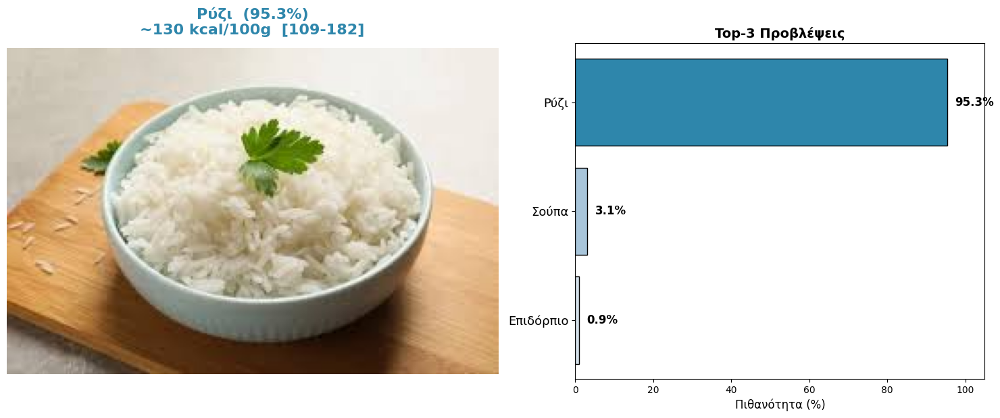


  Πρόβλεψη: Ρύζι (Rice) - confidence 95.3%
  Εκτίμηση θερμίδων: 130 kcal/100g (εύρος 109-182)


In [7]:
from google.colab import files

print("Ανέβασε φωτογραφία φαγητού:")
uploaded = files.upload()

for filename in uploaded.keys():
    img, top_classes, top_probs, kcal, kcal_min, kcal_max = predict_food(filename)

    pred = top_classes[0]
    pred_gr = CLASS_NAMES_GR[pred]
    conf = top_probs[0]

    # Visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6),
                                    gridspec_kw={'width_ratios': [1.2, 1]})

    # Εικόνα
    ax1.imshow(img)
    ax1.axis('off')
    ax1.set_title(f"{pred_gr}  ({conf*100:.1f}%)\n"
                  f"~{kcal:.0f} kcal/100g  [{kcal_min:.0f}-{kcal_max:.0f}]",
                  fontsize=16, fontweight='bold', color='#2E86AB', pad=15)

    # Top-3 bars
    classes_gr = [CLASS_NAMES_GR[c] for c in top_classes]
    probs_pct = [p * 100 for p in top_probs]
    colors = ['#2E86AB', '#A8C5DA', '#D5E1EB']
    bars = ax2.barh(range(3), probs_pct, color=colors, edgecolor='black')
    ax2.set_yticks(range(3))
    ax2.set_yticklabels(classes_gr, fontsize=13)
    ax2.invert_yaxis()
    ax2.set_xlabel('Πιθανότητα (%)', fontsize=12)
    ax2.set_title('Top-3 Προβλέψεις', fontsize=14, fontweight='bold')
    ax2.set_xlim([0, 105])
    for bar, prob in zip(bars, probs_pct):
        ax2.text(prob + 2, bar.get_y() + bar.get_height()/2,
                 f'{prob:.1f}%', va='center', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

    print(f"\n  Πρόβλεψη: {pred_gr} ({pred}) - confidence {conf*100:.1f}%")
    print(f"  Εκτίμηση θερμίδων: {kcal:.0f} kcal/100g (εύρος {kcal_min:.0f}-{kcal_max:.0f})")